In [1]:
import torch
import torchvision
from torch import nn
import torch.nn.functional as F
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from torch.autograd import Variable

from PIL import Image
import os

In [2]:
class ImagesDataset(Dataset):
    
    def __init__(self, root_dir):
        self.root_dir = root_dir
        self.img_names = os.listdir(root_dir)
        self.data_transforms = transforms.Compose([
            transforms.RandomHorizontalFlip(),
            transforms.RandomVerticalFlip(),
            transforms.ToTensor()])
        
    def __getitem__(self, index):
        img = Image.open(self.root_dir + '/' + self.img_names[index]).convert('L')
        item = self.data_transforms(img)
        img.close()
        min = item.min()
        max = item.max()
        if min != max:
            item = (item - min) / (max - min)
        return item.view(1, 64, 64)

    def __len__(self):
        return len(self.img_names)

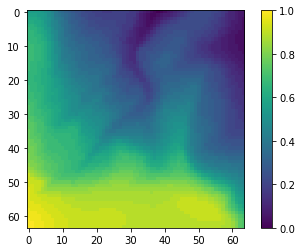

In [10]:
import matplotlib.pyplot as plt

dataset = ImagesDataset('./data')
p = plt.imshow(dataset[42600].view(64, 64))
plt.colorbar(p)
plt.show()

In [85]:
batch_size = 100
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

In [728]:
def cnn(in_n, out_n):
    return nn.Sequential(nn.Conv2d(in_n, out_n, kernel_size=3, padding=1)) # fix

In [729]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.cnn_1 = cnn(1, 32)
        self.cnn_2 = cnn(32, 64)
        self.cnn_3 = cnn(64, 128)
        self.cnn_4 = cnn(128, 256)
        self.cnn_5 = cnn(256, 1)
        
    def forward(self, data):
        x = self.cnn_1(data)
        x = F.leaky_relu(F.max_pool2d(x, 2))
        
        x = self.cnn_2(x)
        x = F.leaky_relu(F.max_pool2d(x, 2))
        
        x = self.cnn_3(x)
        x = F.leaky_relu(F.max_pool2d(x, 2))
        
        x = self.cnn_4(x)
        x = F.leaky_relu(F.max_pool2d(x, 8))
        
        x = torch.sigmoid(self.cnn_5(x))
        return x

In [730]:
disc = Discriminator().cuda()

In [731]:
x = dataset[400].cuda()
out = disc(x.view(1, 1, 64, 64))
print(out.item())

0.4983478784561157


In [732]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.linear_1 = nn.Linear(64, 4096)
        
        self.cnn_1 = cnn(256, 128)
        self.cnn_2 = cnn(128, 64)
        self.cnn_3 = cnn(64, 32)
        self.cnn_4 = cnn(32, 1)
        
    def forward(self, data):
        x = F.leaky_relu(self.linear_1(data))
        x = x.view(x.size(0), 256, 4, 4)
        
        x = F.interpolate(x, 8)
        x = F.leaky_relu(self.cnn_1(x))
        
        x = F.interpolate(x, 16)
        x = F.leaky_relu(self.cnn_2(x))
        
        x = F.interpolate(x, 32)
        x = F.leaky_relu(self.cnn_3(x))
        
        x = F.interpolate(x, 64)
        x = torch.sigmoid(self.cnn_4(x))
        return x

In [733]:
gen = Generator().cuda()

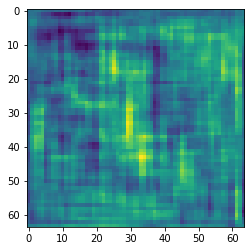

In [734]:
code = torch.randn(1, 64)
out = gen(code.cuda())
plt.imshow(out.view(64, 64).cpu().detach().numpy())
plt.show()

In [354]:
import torch.optim as optim

disc_optimizer = optim.Adam(disc.parameters(), lr=0.001, betas=(0.5, 0.999))
gen_optimizer = optim.Adam(gen.parameters(), lr=0.001, betas=(0.5, 0.999))

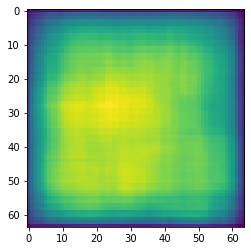

epoch[1/100], disc_loss=1.386, gen_loss=0.669


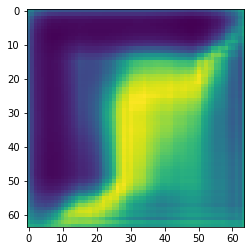

epoch[1/100], disc_loss=1.386, gen_loss=0.724


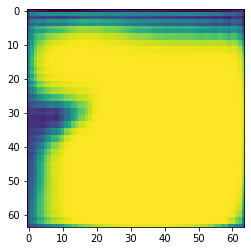

epoch[1/100], disc_loss=1.345, gen_loss=0.880


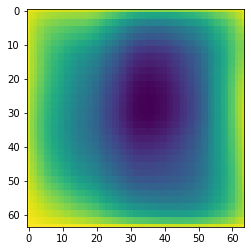

epoch[1/100], disc_loss=0.861, gen_loss=1.336


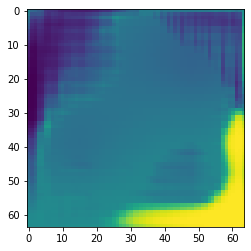

epoch[1/100], disc_loss=1.354, gen_loss=1.037


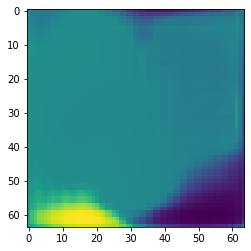

epoch[1/100], disc_loss=1.308, gen_loss=0.841


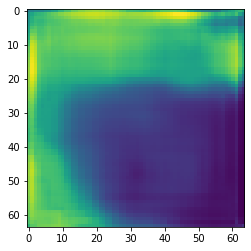

epoch[2/100], disc_loss=1.389, gen_loss=0.681


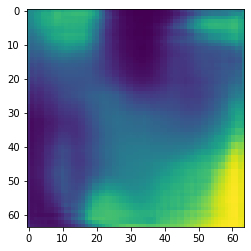

epoch[2/100], disc_loss=1.405, gen_loss=0.790


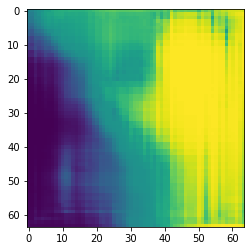

epoch[2/100], disc_loss=1.359, gen_loss=0.704


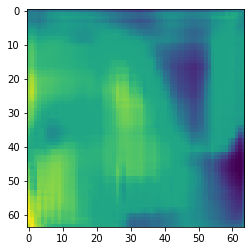

epoch[2/100], disc_loss=1.311, gen_loss=0.808


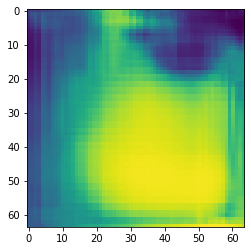

epoch[2/100], disc_loss=1.310, gen_loss=0.668


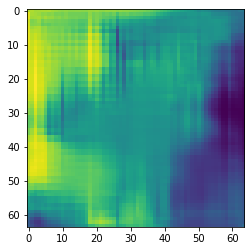

epoch[2/100], disc_loss=1.269, gen_loss=0.840


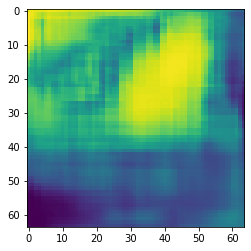

epoch[3/100], disc_loss=1.298, gen_loss=1.078


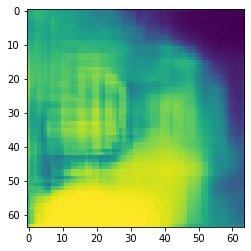

epoch[3/100], disc_loss=1.308, gen_loss=0.830


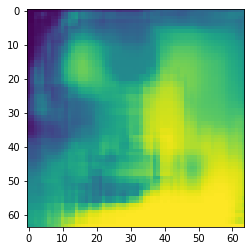

epoch[3/100], disc_loss=1.223, gen_loss=1.386


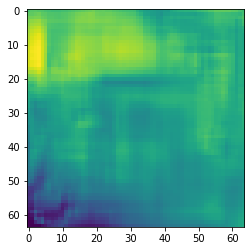

epoch[3/100], disc_loss=1.191, gen_loss=1.185


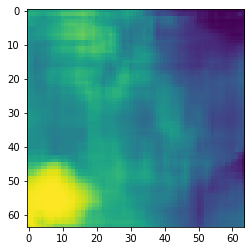

epoch[3/100], disc_loss=1.267, gen_loss=0.955


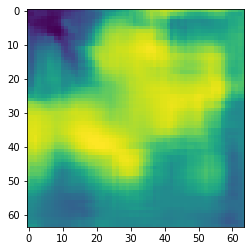

epoch[3/100], disc_loss=1.308, gen_loss=0.913


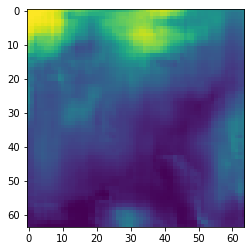

epoch[4/100], disc_loss=1.196, gen_loss=0.974


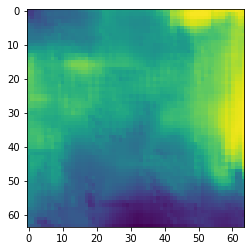

epoch[4/100], disc_loss=1.207, gen_loss=0.971


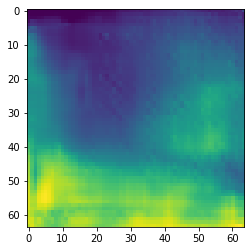

epoch[4/100], disc_loss=1.207, gen_loss=1.117


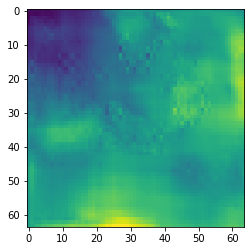

epoch[4/100], disc_loss=1.305, gen_loss=0.722


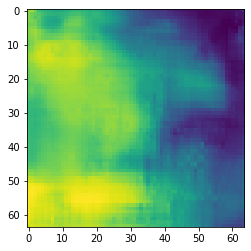

epoch[4/100], disc_loss=1.248, gen_loss=0.859


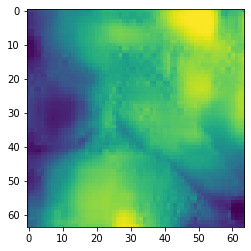

epoch[4/100], disc_loss=1.262, gen_loss=1.460


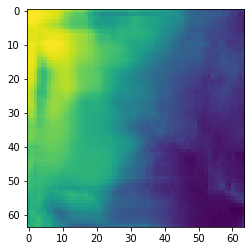

epoch[5/100], disc_loss=1.143, gen_loss=1.080


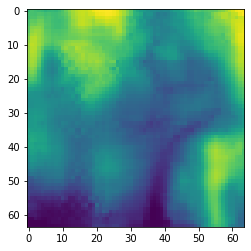

epoch[5/100], disc_loss=1.198, gen_loss=1.028


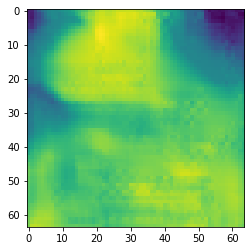

epoch[5/100], disc_loss=1.154, gen_loss=1.156


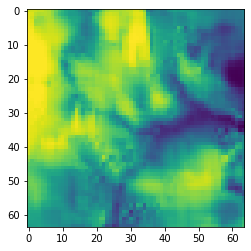

epoch[5/100], disc_loss=1.164, gen_loss=0.963


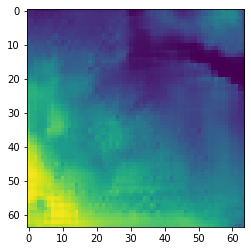

epoch[5/100], disc_loss=1.220, gen_loss=1.681


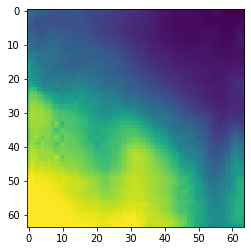

epoch[5/100], disc_loss=1.176, gen_loss=1.220


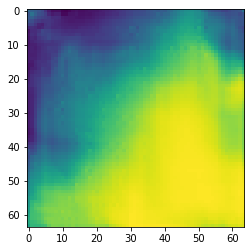

epoch[6/100], disc_loss=1.201, gen_loss=2.075


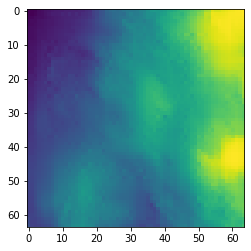

epoch[6/100], disc_loss=1.032, gen_loss=1.253


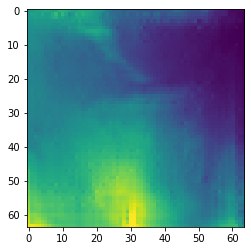

epoch[6/100], disc_loss=1.094, gen_loss=1.215


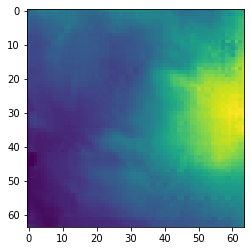

epoch[6/100], disc_loss=1.179, gen_loss=1.965


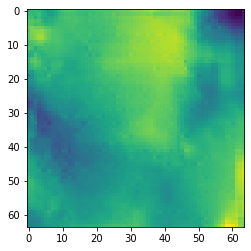

epoch[6/100], disc_loss=1.096, gen_loss=1.614


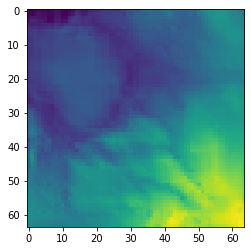

epoch[6/100], disc_loss=1.124, gen_loss=1.368


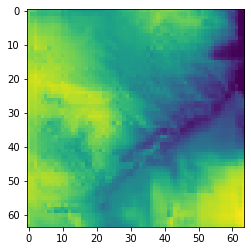

epoch[7/100], disc_loss=1.202, gen_loss=2.040


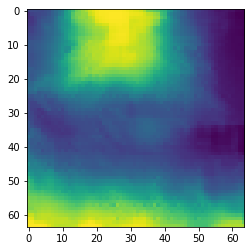

epoch[7/100], disc_loss=1.030, gen_loss=1.125


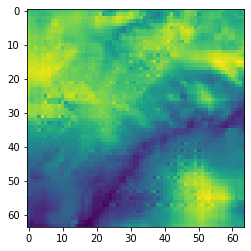

epoch[7/100], disc_loss=1.228, gen_loss=0.703


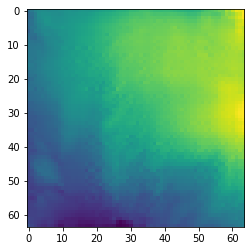

epoch[7/100], disc_loss=1.020, gen_loss=1.260


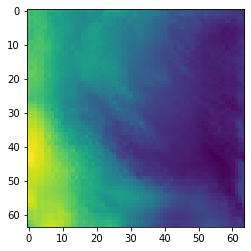

epoch[7/100], disc_loss=1.022, gen_loss=1.585


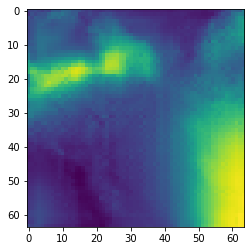

epoch[7/100], disc_loss=1.012, gen_loss=1.118


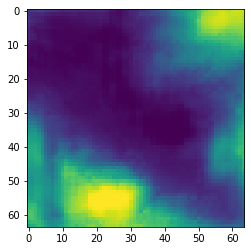

epoch[8/100], disc_loss=1.278, gen_loss=0.528


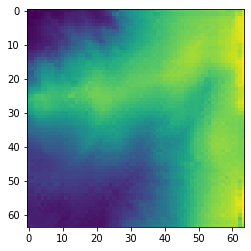

epoch[8/100], disc_loss=0.961, gen_loss=1.417


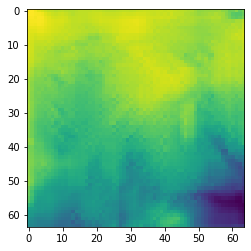

epoch[8/100], disc_loss=1.004, gen_loss=0.955


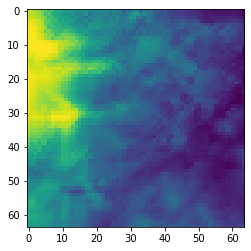

epoch[8/100], disc_loss=1.028, gen_loss=1.139


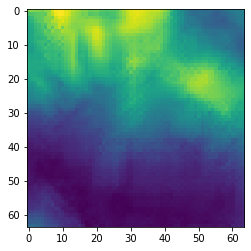

epoch[8/100], disc_loss=0.914, gen_loss=1.592


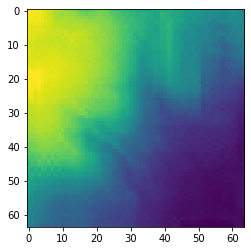

epoch[8/100], disc_loss=0.909, gen_loss=1.701


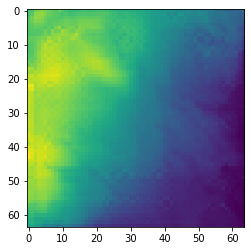

epoch[9/100], disc_loss=0.956, gen_loss=2.150


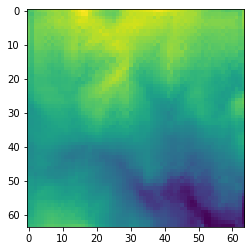

epoch[9/100], disc_loss=1.010, gen_loss=1.290


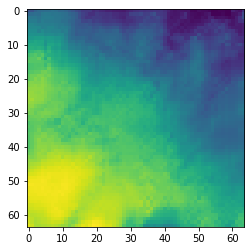

epoch[9/100], disc_loss=0.949, gen_loss=1.411


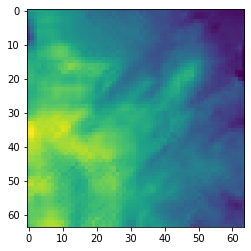

epoch[9/100], disc_loss=0.957, gen_loss=1.287


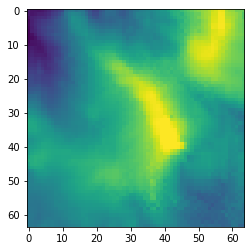

epoch[9/100], disc_loss=0.947, gen_loss=1.013


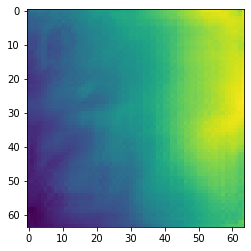

epoch[9/100], disc_loss=0.888, gen_loss=1.789


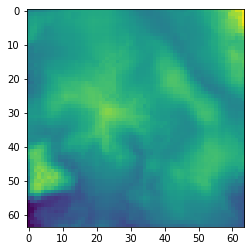

epoch[10/100], disc_loss=0.899, gen_loss=1.153


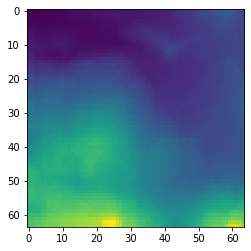

epoch[10/100], disc_loss=0.919, gen_loss=1.550


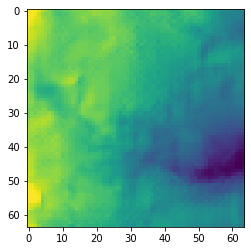

epoch[10/100], disc_loss=0.931, gen_loss=1.818


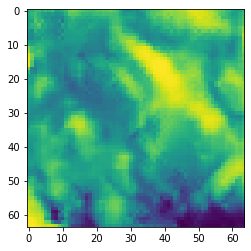

epoch[10/100], disc_loss=0.968, gen_loss=1.278


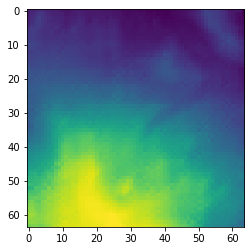

epoch[10/100], disc_loss=0.940, gen_loss=1.348


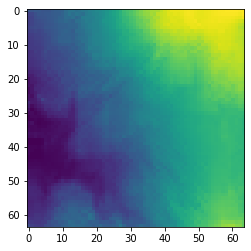

epoch[10/100], disc_loss=0.861, gen_loss=2.005


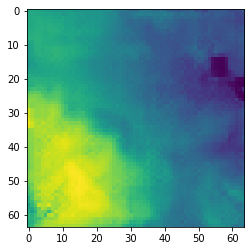

epoch[11/100], disc_loss=1.612, gen_loss=0.281


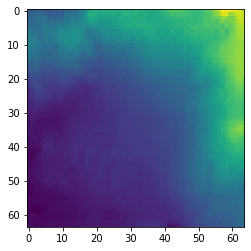

epoch[11/100], disc_loss=0.927, gen_loss=2.163


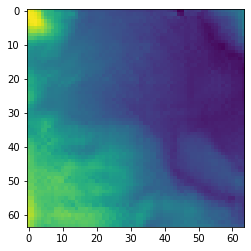

epoch[11/100], disc_loss=0.921, gen_loss=1.650


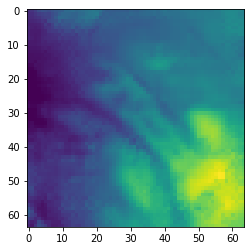

epoch[11/100], disc_loss=0.869, gen_loss=1.511


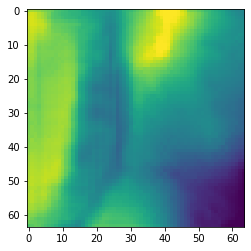

epoch[11/100], disc_loss=1.025, gen_loss=2.261


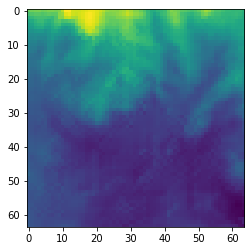

epoch[11/100], disc_loss=0.895, gen_loss=1.666


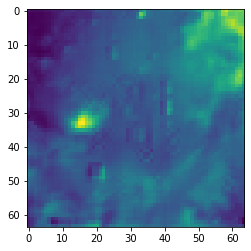

epoch[12/100], disc_loss=0.999, gen_loss=3.071


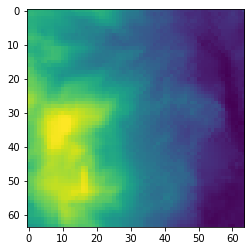

epoch[12/100], disc_loss=0.940, gen_loss=1.328


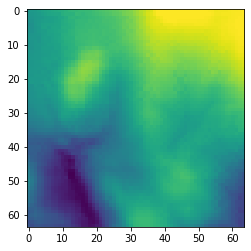

epoch[12/100], disc_loss=0.902, gen_loss=1.839


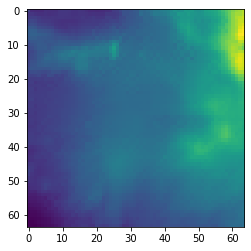

epoch[12/100], disc_loss=0.880, gen_loss=1.687


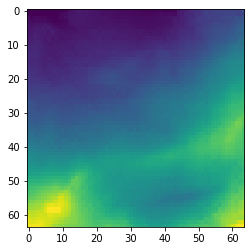

epoch[12/100], disc_loss=0.867, gen_loss=1.717


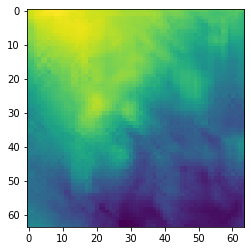

epoch[12/100], disc_loss=0.921, gen_loss=2.096


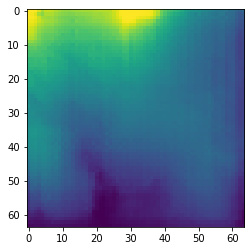

epoch[13/100], disc_loss=0.871, gen_loss=2.054


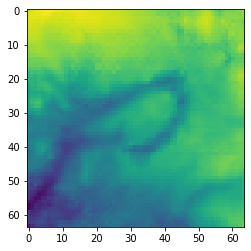

epoch[13/100], disc_loss=0.852, gen_loss=2.346


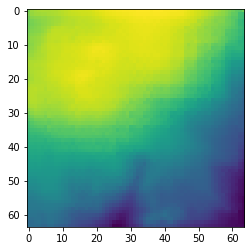

epoch[13/100], disc_loss=0.832, gen_loss=2.068


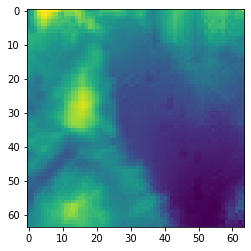

epoch[13/100], disc_loss=0.861, gen_loss=1.485


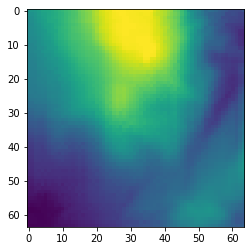

epoch[13/100], disc_loss=1.051, gen_loss=2.306


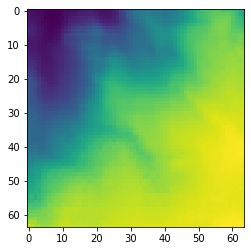

epoch[13/100], disc_loss=0.856, gen_loss=1.898


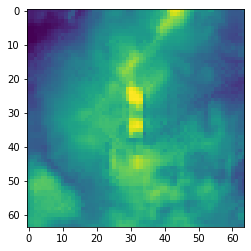

epoch[14/100], disc_loss=1.057, gen_loss=0.827


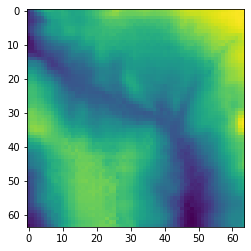

epoch[14/100], disc_loss=0.866, gen_loss=1.727


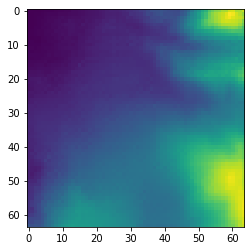

epoch[14/100], disc_loss=0.929, gen_loss=2.289


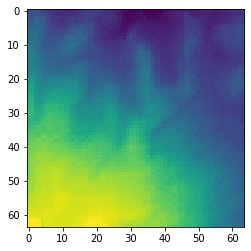

epoch[14/100], disc_loss=0.954, gen_loss=2.203


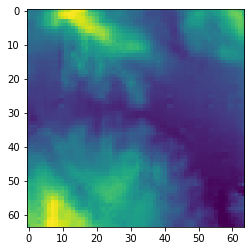

epoch[14/100], disc_loss=0.867, gen_loss=2.213


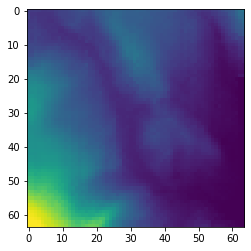

epoch[14/100], disc_loss=0.905, gen_loss=1.391


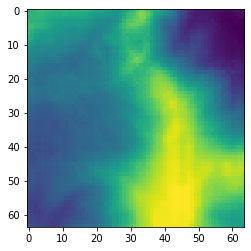

epoch[15/100], disc_loss=1.377, gen_loss=0.691


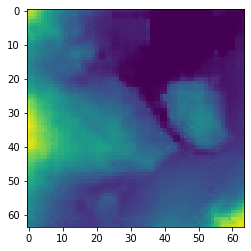

epoch[15/100], disc_loss=1.002, gen_loss=1.118


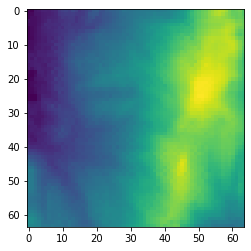

epoch[15/100], disc_loss=0.948, gen_loss=2.133


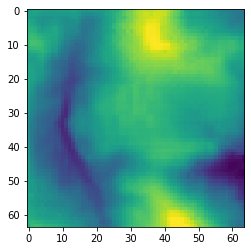

epoch[15/100], disc_loss=0.838, gen_loss=2.006


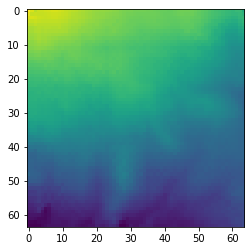

epoch[15/100], disc_loss=0.899, gen_loss=1.879


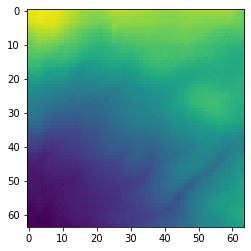

epoch[15/100], disc_loss=0.846, gen_loss=1.392


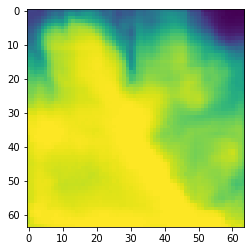

epoch[16/100], disc_loss=0.927, gen_loss=1.454


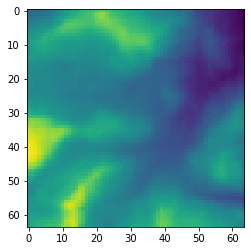

epoch[16/100], disc_loss=0.896, gen_loss=1.343


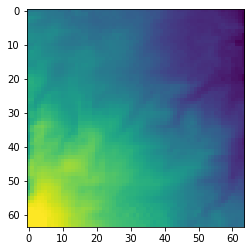

epoch[16/100], disc_loss=0.827, gen_loss=1.810


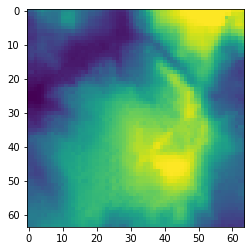

epoch[16/100], disc_loss=0.863, gen_loss=1.575


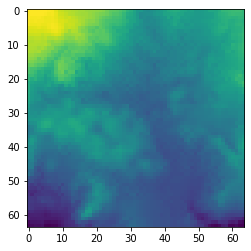

epoch[16/100], disc_loss=0.880, gen_loss=1.649


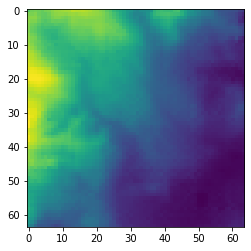

epoch[16/100], disc_loss=0.824, gen_loss=2.268


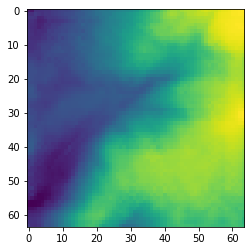

epoch[17/100], disc_loss=0.853, gen_loss=2.550


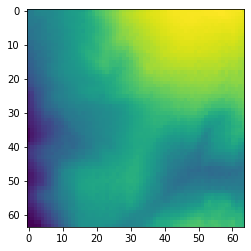

epoch[17/100], disc_loss=0.918, gen_loss=1.463


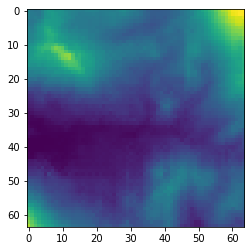

epoch[17/100], disc_loss=0.798, gen_loss=1.705


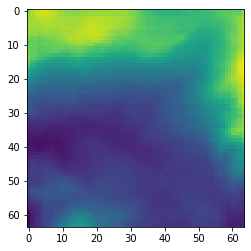

epoch[17/100], disc_loss=1.511, gen_loss=0.317


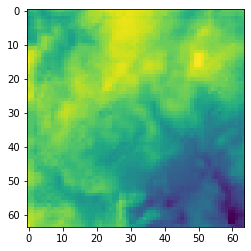

epoch[17/100], disc_loss=0.837, gen_loss=1.687


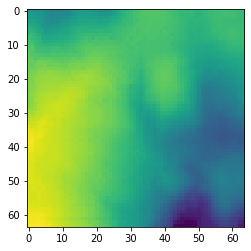

epoch[17/100], disc_loss=0.835, gen_loss=1.581


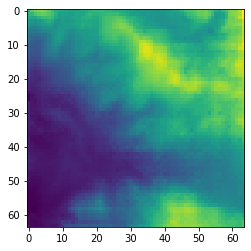

epoch[18/100], disc_loss=1.262, gen_loss=0.336


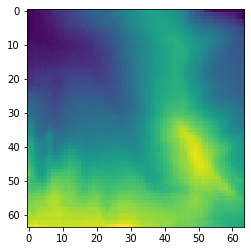

epoch[18/100], disc_loss=0.857, gen_loss=1.798


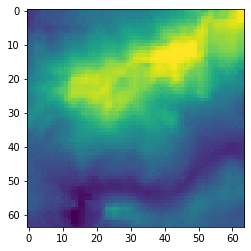

epoch[18/100], disc_loss=0.773, gen_loss=1.942


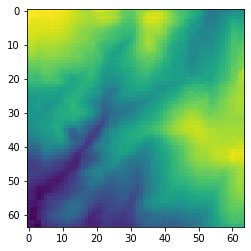

epoch[18/100], disc_loss=0.824, gen_loss=1.800


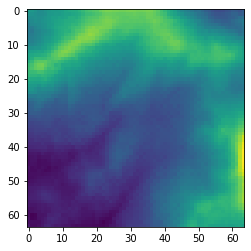

epoch[18/100], disc_loss=1.107, gen_loss=2.658


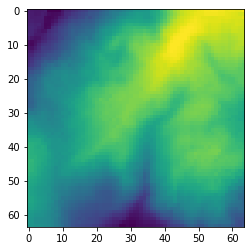

epoch[18/100], disc_loss=0.790, gen_loss=1.723


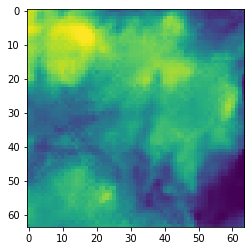

epoch[19/100], disc_loss=1.017, gen_loss=2.611


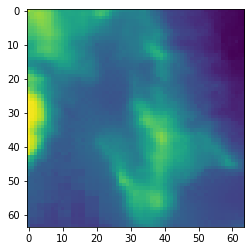

epoch[19/100], disc_loss=0.793, gen_loss=1.779


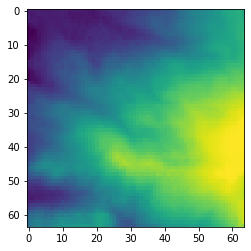

epoch[19/100], disc_loss=0.806, gen_loss=2.251


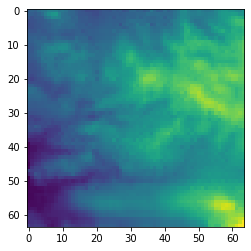

epoch[19/100], disc_loss=0.887, gen_loss=2.999


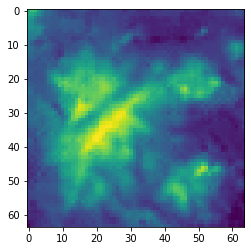

epoch[19/100], disc_loss=0.799, gen_loss=1.791


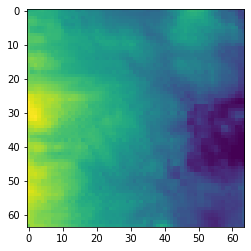

epoch[19/100], disc_loss=0.837, gen_loss=2.089


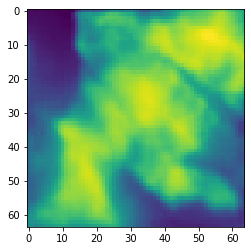

epoch[20/100], disc_loss=0.943, gen_loss=1.462


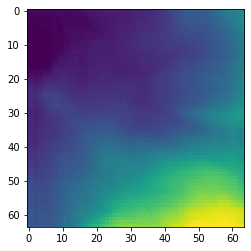

epoch[20/100], disc_loss=0.775, gen_loss=2.015


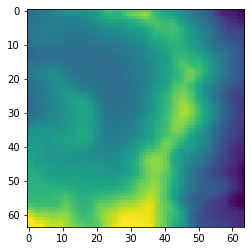

epoch[20/100], disc_loss=0.831, gen_loss=1.690


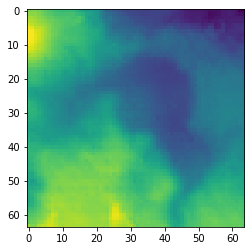

epoch[20/100], disc_loss=0.790, gen_loss=1.599


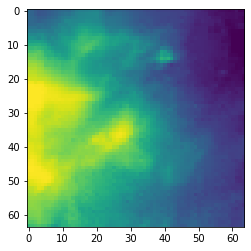

epoch[20/100], disc_loss=0.844, gen_loss=2.196


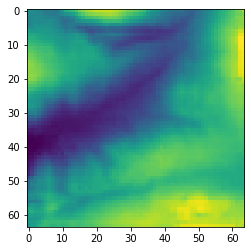

epoch[20/100], disc_loss=0.808, gen_loss=2.134


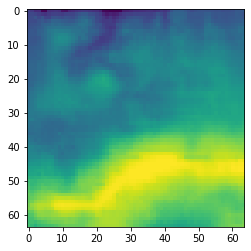

epoch[21/100], disc_loss=1.038, gen_loss=1.556


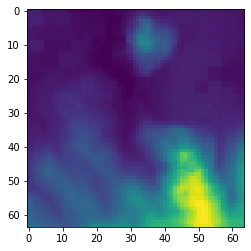

epoch[21/100], disc_loss=0.882, gen_loss=2.438


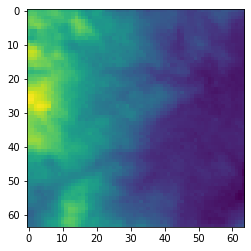

epoch[21/100], disc_loss=0.841, gen_loss=1.657


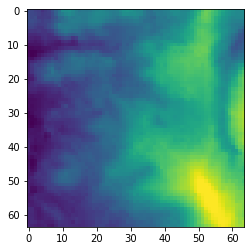

epoch[21/100], disc_loss=0.871, gen_loss=2.470


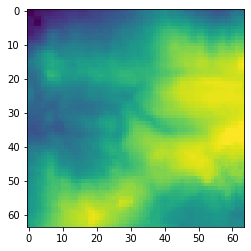

epoch[21/100], disc_loss=0.854, gen_loss=2.621


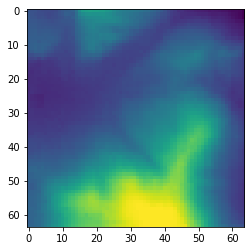

epoch[21/100], disc_loss=0.874, gen_loss=1.229


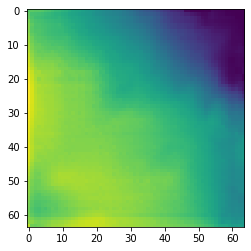

epoch[22/100], disc_loss=1.660, gen_loss=0.154


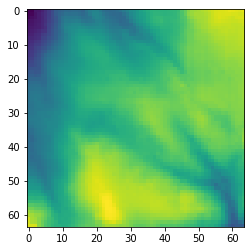

epoch[22/100], disc_loss=0.900, gen_loss=2.124


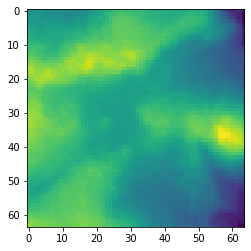

epoch[22/100], disc_loss=0.805, gen_loss=1.990


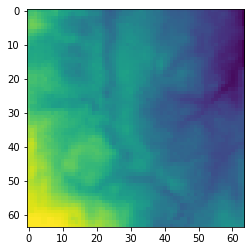

epoch[22/100], disc_loss=0.780, gen_loss=1.943


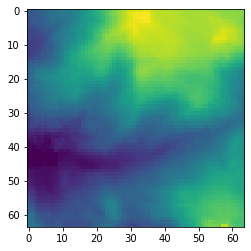

epoch[22/100], disc_loss=0.799, gen_loss=1.688


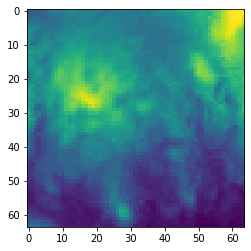

epoch[22/100], disc_loss=0.827, gen_loss=1.660


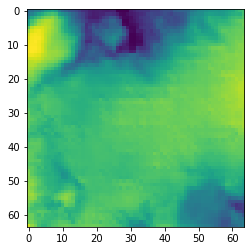

epoch[23/100], disc_loss=0.860, gen_loss=1.510


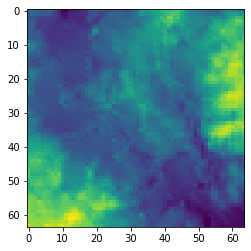

epoch[23/100], disc_loss=0.787, gen_loss=2.220


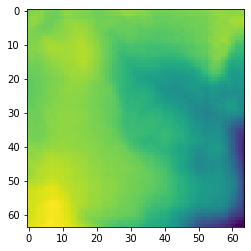

epoch[23/100], disc_loss=0.833, gen_loss=2.809


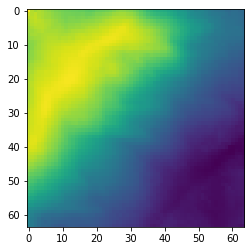

epoch[23/100], disc_loss=0.787, gen_loss=2.077


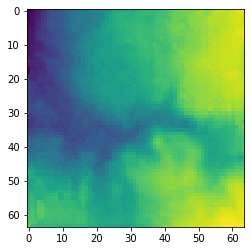

epoch[23/100], disc_loss=0.788, gen_loss=2.062


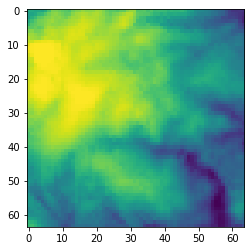

epoch[23/100], disc_loss=0.825, gen_loss=2.760


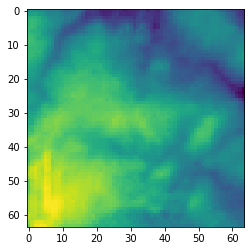

epoch[24/100], disc_loss=0.844, gen_loss=2.353


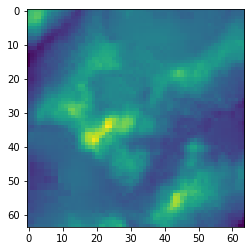

epoch[24/100], disc_loss=0.841, gen_loss=1.507


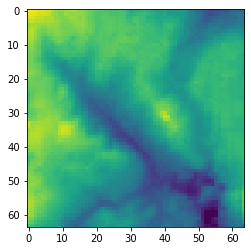

epoch[24/100], disc_loss=0.765, gen_loss=2.022


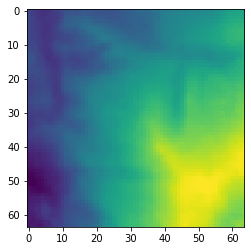

epoch[24/100], disc_loss=0.873, gen_loss=2.760


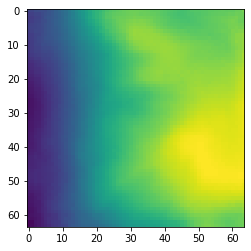

epoch[24/100], disc_loss=0.799, gen_loss=2.018


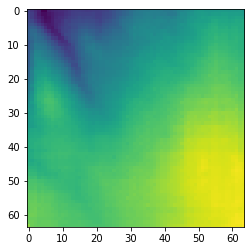

epoch[24/100], disc_loss=0.837, gen_loss=1.836


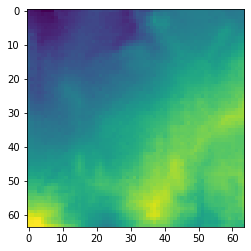

epoch[25/100], disc_loss=1.003, gen_loss=0.788


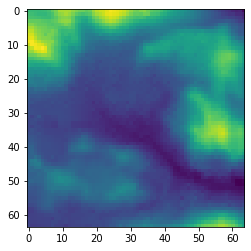

epoch[25/100], disc_loss=0.800, gen_loss=2.017


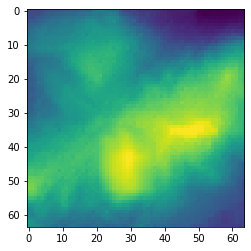

epoch[25/100], disc_loss=0.786, gen_loss=2.077


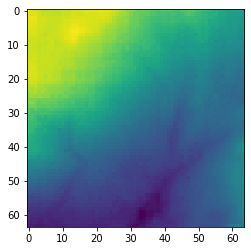

epoch[25/100], disc_loss=0.781, gen_loss=2.219


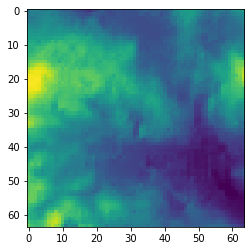

epoch[25/100], disc_loss=0.762, gen_loss=1.961


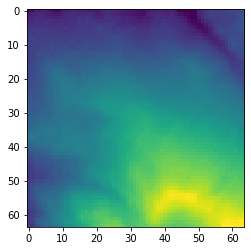

epoch[25/100], disc_loss=0.778, gen_loss=2.087


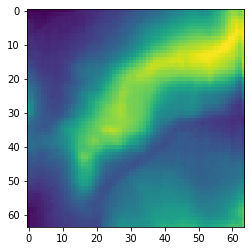

epoch[26/100], disc_loss=0.833, gen_loss=1.451


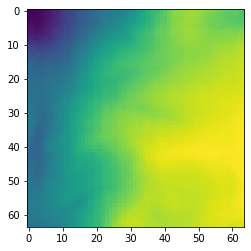

epoch[26/100], disc_loss=0.762, gen_loss=2.176


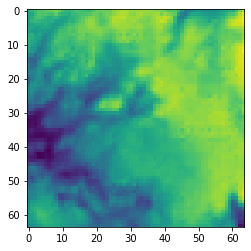

epoch[26/100], disc_loss=0.825, gen_loss=1.735


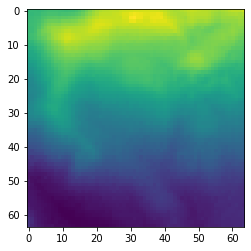

epoch[26/100], disc_loss=0.826, gen_loss=1.783


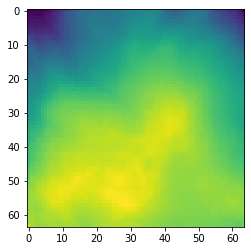

epoch[26/100], disc_loss=0.924, gen_loss=1.569


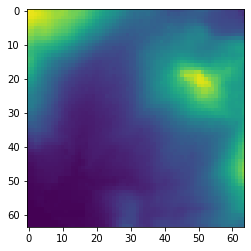

epoch[26/100], disc_loss=0.783, gen_loss=1.906


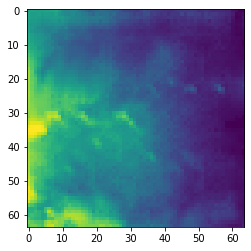

epoch[27/100], disc_loss=0.800, gen_loss=2.410


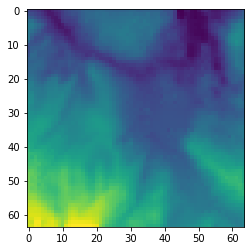

epoch[27/100], disc_loss=0.859, gen_loss=2.129


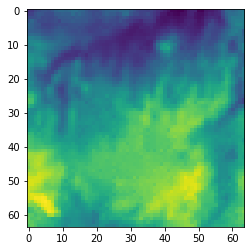

epoch[27/100], disc_loss=0.772, gen_loss=1.975


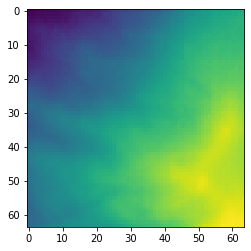

epoch[27/100], disc_loss=0.784, gen_loss=2.171


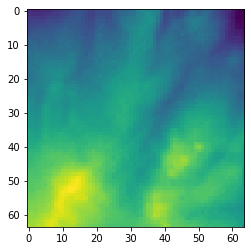

epoch[27/100], disc_loss=0.762, gen_loss=2.093


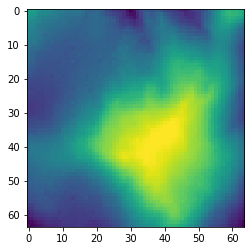

epoch[27/100], disc_loss=0.761, gen_loss=2.743


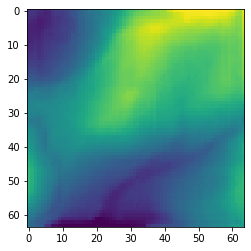

epoch[28/100], disc_loss=0.931, gen_loss=0.965


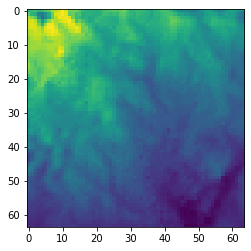

epoch[28/100], disc_loss=0.754, gen_loss=2.620


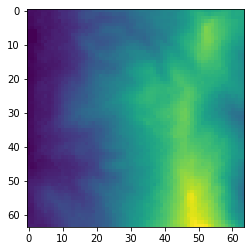

epoch[28/100], disc_loss=0.744, gen_loss=2.349


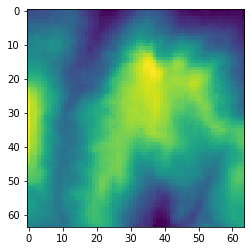

epoch[28/100], disc_loss=0.986, gen_loss=2.760


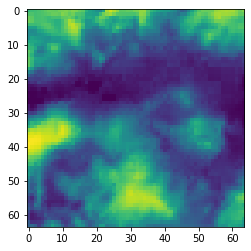

epoch[28/100], disc_loss=0.748, gen_loss=2.031


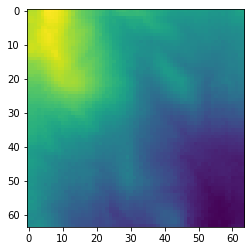

epoch[28/100], disc_loss=0.798, gen_loss=2.426


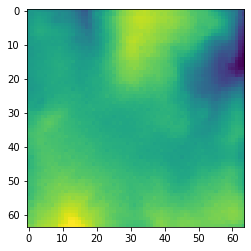

epoch[29/100], disc_loss=0.918, gen_loss=1.461


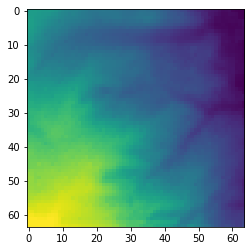

epoch[29/100], disc_loss=0.744, gen_loss=2.144


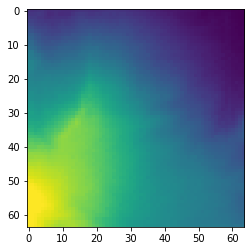

epoch[29/100], disc_loss=0.793, gen_loss=1.751


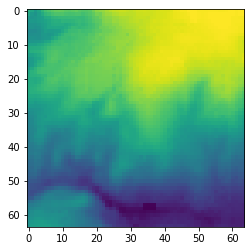

epoch[29/100], disc_loss=0.750, gen_loss=2.102


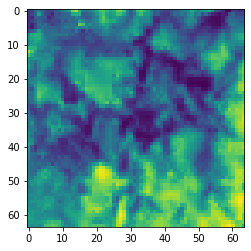

epoch[29/100], disc_loss=0.769, gen_loss=2.109


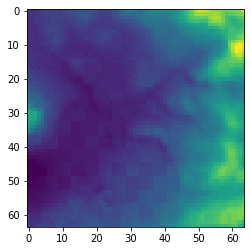

epoch[29/100], disc_loss=0.755, gen_loss=2.176


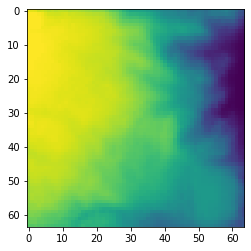

epoch[30/100], disc_loss=0.800, gen_loss=1.681


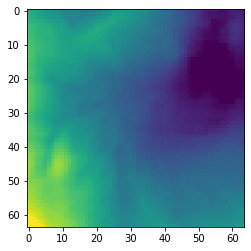

epoch[30/100], disc_loss=0.804, gen_loss=2.473


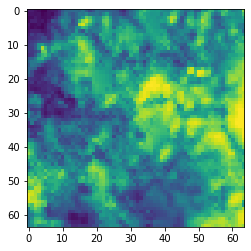

epoch[30/100], disc_loss=0.786, gen_loss=2.004


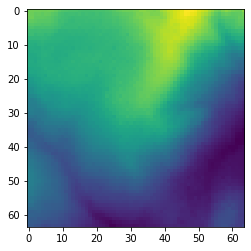

epoch[30/100], disc_loss=0.917, gen_loss=1.216


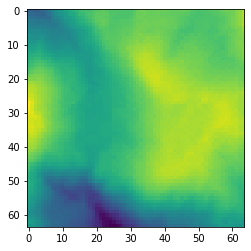

epoch[30/100], disc_loss=0.750, gen_loss=2.240


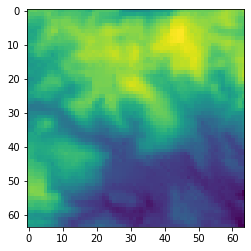

epoch[30/100], disc_loss=0.754, gen_loss=2.482


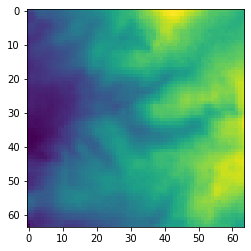

epoch[31/100], disc_loss=1.092, gen_loss=3.708


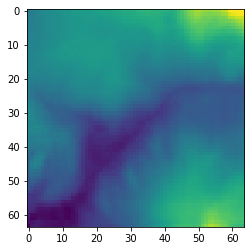

epoch[31/100], disc_loss=0.786, gen_loss=1.890


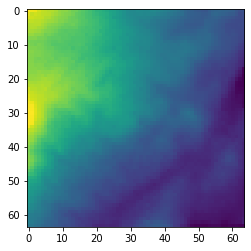

epoch[31/100], disc_loss=0.813, gen_loss=1.784


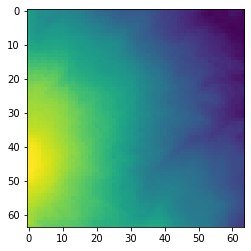

epoch[31/100], disc_loss=0.772, gen_loss=1.799


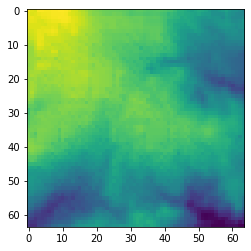

epoch[31/100], disc_loss=0.733, gen_loss=2.240


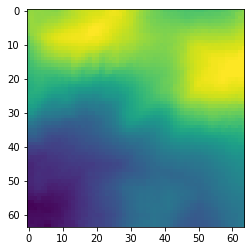

epoch[31/100], disc_loss=0.763, gen_loss=1.962


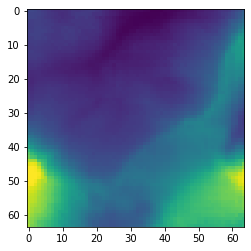

epoch[32/100], disc_loss=1.663, gen_loss=3.920


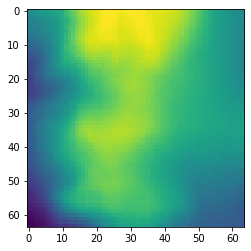

epoch[32/100], disc_loss=0.779, gen_loss=1.828


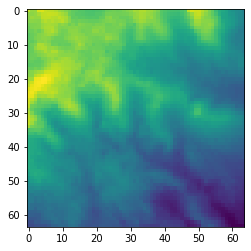

epoch[32/100], disc_loss=0.754, gen_loss=2.224


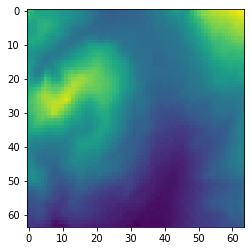

epoch[32/100], disc_loss=0.747, gen_loss=2.199


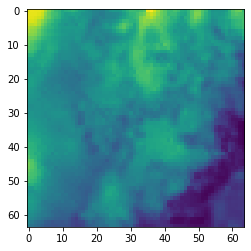

epoch[32/100], disc_loss=0.746, gen_loss=2.284


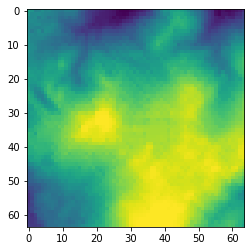

epoch[32/100], disc_loss=0.784, gen_loss=1.753


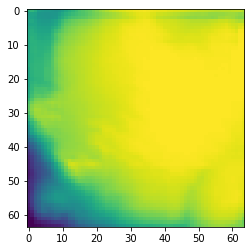

epoch[33/100], disc_loss=0.748, gen_loss=1.906


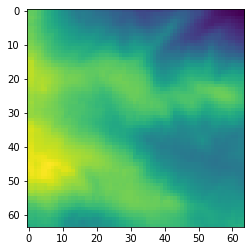

epoch[33/100], disc_loss=0.739, gen_loss=2.001


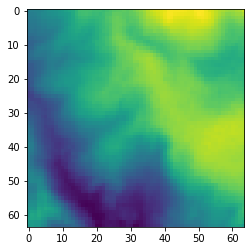

epoch[33/100], disc_loss=0.763, gen_loss=2.239


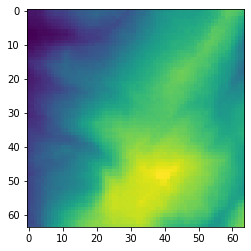

epoch[33/100], disc_loss=0.741, gen_loss=2.173


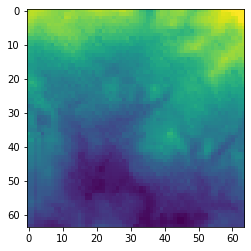

epoch[33/100], disc_loss=0.784, gen_loss=2.276


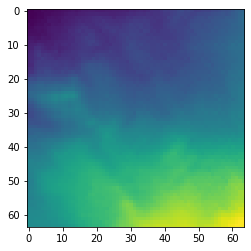

epoch[33/100], disc_loss=0.756, gen_loss=2.438


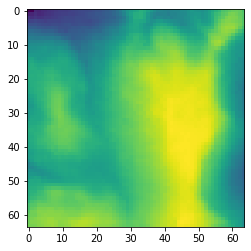

epoch[34/100], disc_loss=1.355, gen_loss=3.598


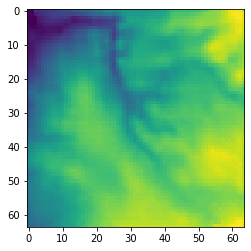

epoch[34/100], disc_loss=0.769, gen_loss=2.136


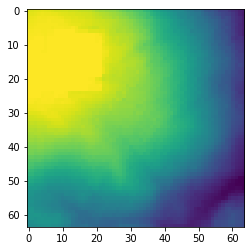

epoch[34/100], disc_loss=0.752, gen_loss=2.453


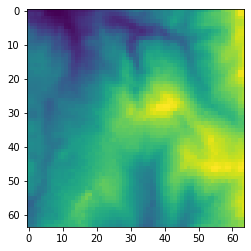

epoch[34/100], disc_loss=0.735, gen_loss=2.206


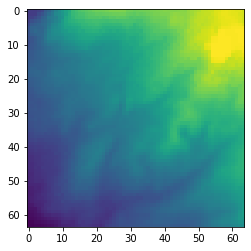

epoch[34/100], disc_loss=0.765, gen_loss=2.210


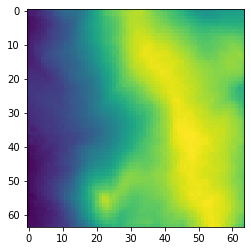

epoch[34/100], disc_loss=0.764, gen_loss=1.947


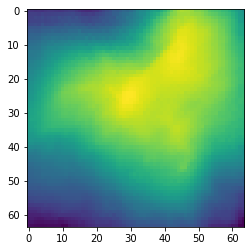

epoch[35/100], disc_loss=0.728, gen_loss=2.064


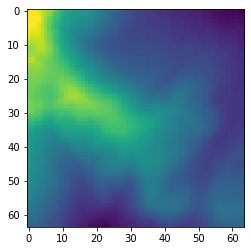

epoch[35/100], disc_loss=0.765, gen_loss=2.090


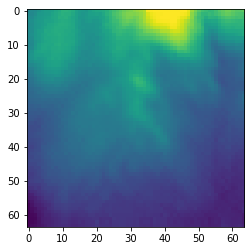

epoch[35/100], disc_loss=0.763, gen_loss=1.901


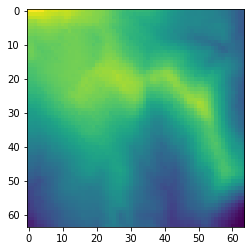

epoch[35/100], disc_loss=0.743, gen_loss=1.847


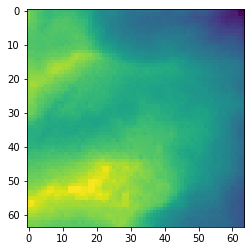

epoch[35/100], disc_loss=0.781, gen_loss=2.235


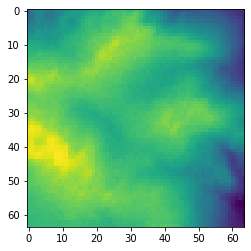

epoch[35/100], disc_loss=0.783, gen_loss=2.564


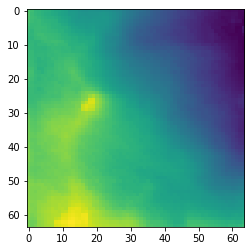

epoch[36/100], disc_loss=0.740, gen_loss=2.446


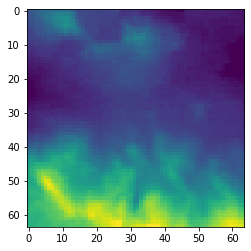

epoch[36/100], disc_loss=0.745, gen_loss=2.408


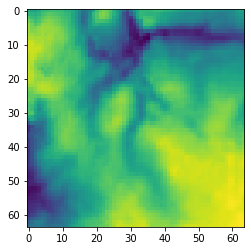

epoch[36/100], disc_loss=0.808, gen_loss=2.268


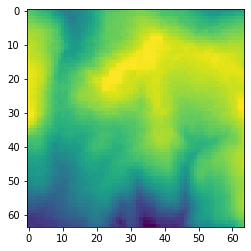

epoch[36/100], disc_loss=0.755, gen_loss=1.683


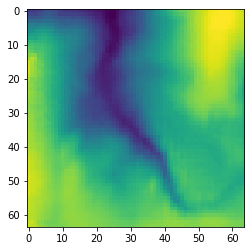

epoch[36/100], disc_loss=0.754, gen_loss=1.941


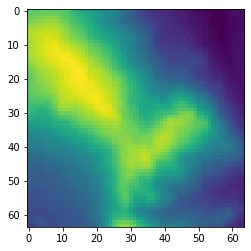

epoch[36/100], disc_loss=0.730, gen_loss=2.115


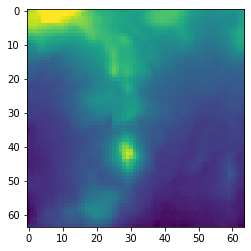

epoch[37/100], disc_loss=0.923, gen_loss=3.819


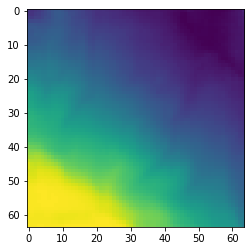

epoch[37/100], disc_loss=0.778, gen_loss=2.168


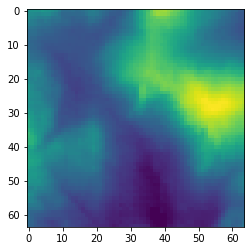

epoch[37/100], disc_loss=0.745, gen_loss=2.362


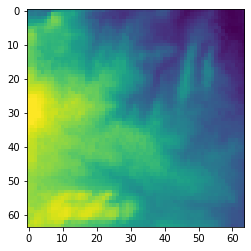

epoch[37/100], disc_loss=0.753, gen_loss=2.159


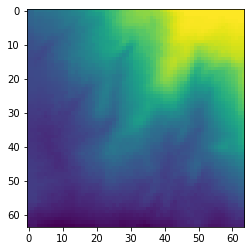

epoch[37/100], disc_loss=0.748, gen_loss=2.491


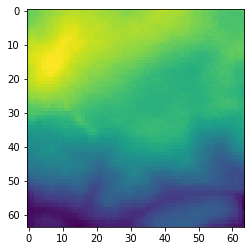

epoch[37/100], disc_loss=0.989, gen_loss=1.043


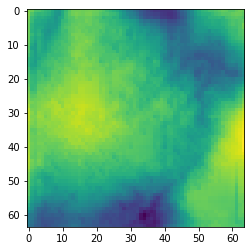

epoch[38/100], disc_loss=0.964, gen_loss=0.555


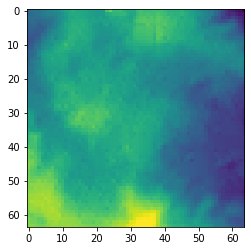

epoch[38/100], disc_loss=0.839, gen_loss=1.507


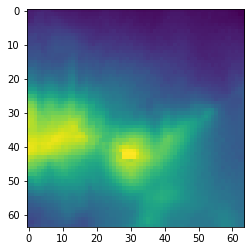

epoch[38/100], disc_loss=0.750, gen_loss=2.294


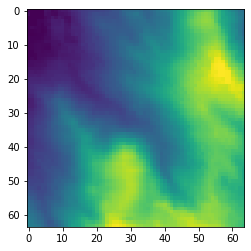

epoch[38/100], disc_loss=0.781, gen_loss=1.855


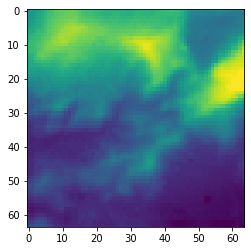

epoch[38/100], disc_loss=0.763, gen_loss=2.190


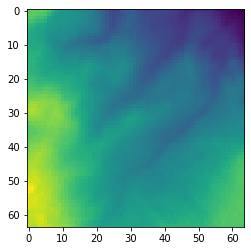

epoch[38/100], disc_loss=0.797, gen_loss=1.948


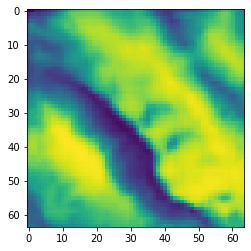

epoch[39/100], disc_loss=0.783, gen_loss=1.476


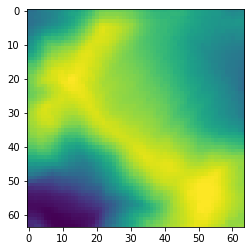

epoch[39/100], disc_loss=0.727, gen_loss=2.265


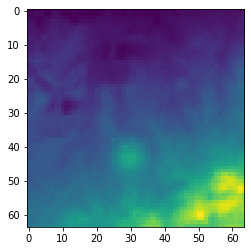

epoch[39/100], disc_loss=0.769, gen_loss=1.946


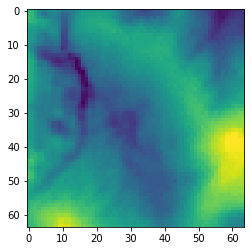

epoch[39/100], disc_loss=0.734, gen_loss=1.921


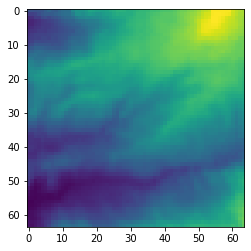

epoch[39/100], disc_loss=0.763, gen_loss=1.826


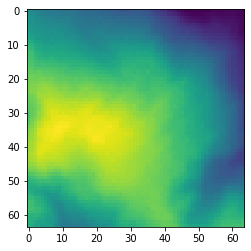

epoch[39/100], disc_loss=0.721, gen_loss=2.537


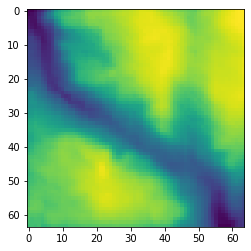

epoch[40/100], disc_loss=0.784, gen_loss=2.313


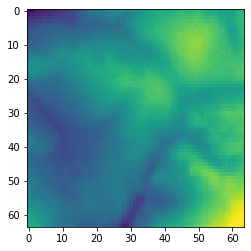

epoch[40/100], disc_loss=0.762, gen_loss=1.802


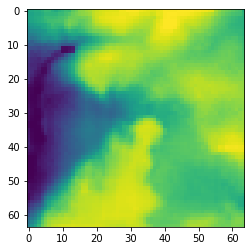

epoch[40/100], disc_loss=0.769, gen_loss=1.877


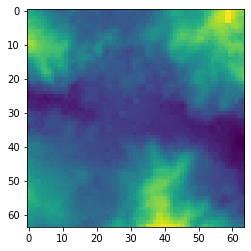

epoch[40/100], disc_loss=0.745, gen_loss=2.216


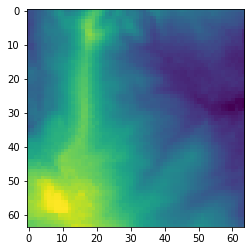

epoch[40/100], disc_loss=0.753, gen_loss=2.388


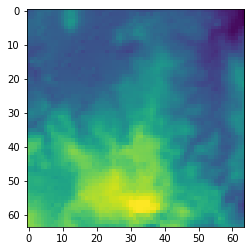

epoch[40/100], disc_loss=0.735, gen_loss=2.254


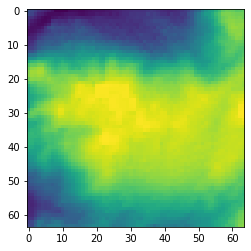

epoch[41/100], disc_loss=1.066, gen_loss=3.066


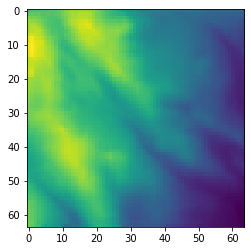

epoch[41/100], disc_loss=0.741, gen_loss=2.200


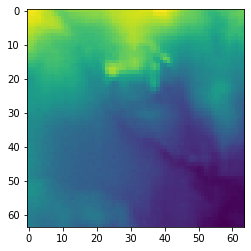

epoch[41/100], disc_loss=0.739, gen_loss=2.102


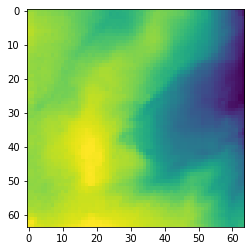

epoch[41/100], disc_loss=0.757, gen_loss=2.301


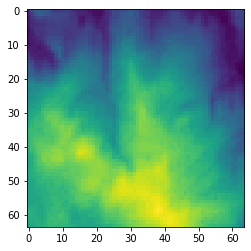

epoch[41/100], disc_loss=0.746, gen_loss=2.070


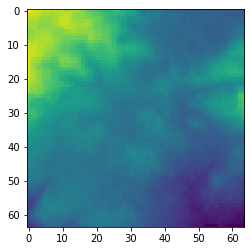

epoch[41/100], disc_loss=0.729, gen_loss=2.175


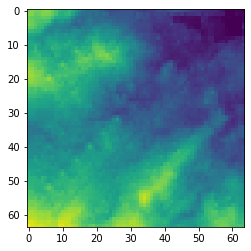

epoch[42/100], disc_loss=0.847, gen_loss=1.676


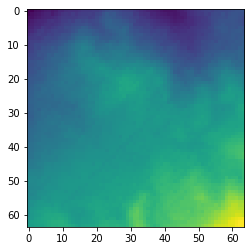

epoch[42/100], disc_loss=0.720, gen_loss=2.145


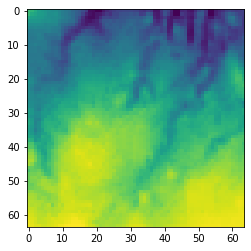

epoch[42/100], disc_loss=0.742, gen_loss=2.168


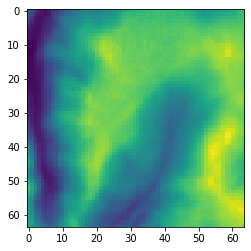

epoch[42/100], disc_loss=0.748, gen_loss=2.093


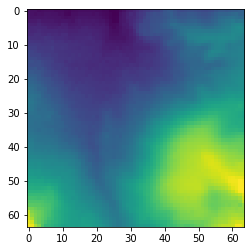

epoch[42/100], disc_loss=0.752, gen_loss=2.111


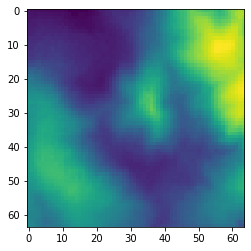

epoch[42/100], disc_loss=0.738, gen_loss=2.386


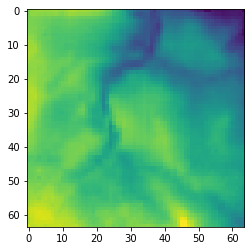

epoch[43/100], disc_loss=0.902, gen_loss=3.484


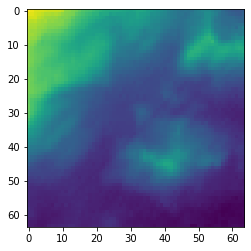

epoch[43/100], disc_loss=0.751, gen_loss=2.288


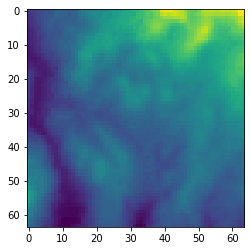

epoch[43/100], disc_loss=0.763, gen_loss=2.093


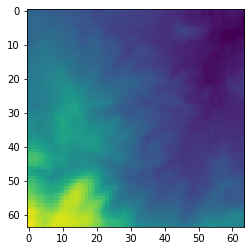

epoch[43/100], disc_loss=0.739, gen_loss=2.208


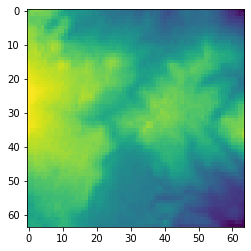

epoch[43/100], disc_loss=0.726, gen_loss=2.402


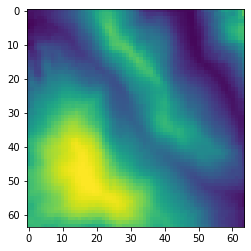

epoch[43/100], disc_loss=0.748, gen_loss=2.290


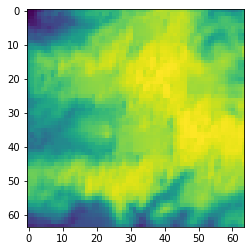

epoch[44/100], disc_loss=0.803, gen_loss=1.164


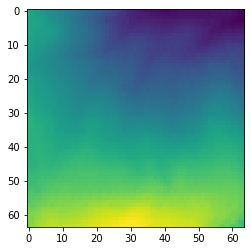

epoch[44/100], disc_loss=0.787, gen_loss=1.983


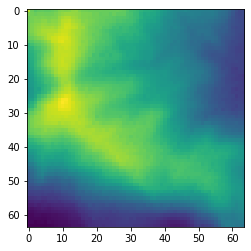

epoch[44/100], disc_loss=0.722, gen_loss=2.354


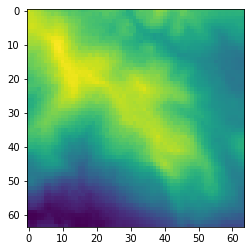

epoch[44/100], disc_loss=0.736, gen_loss=2.417


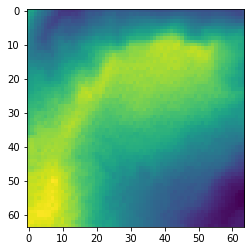

epoch[44/100], disc_loss=0.749, gen_loss=2.335


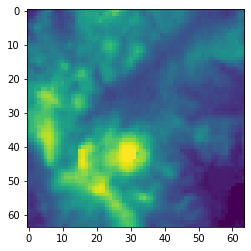

epoch[44/100], disc_loss=0.744, gen_loss=2.309


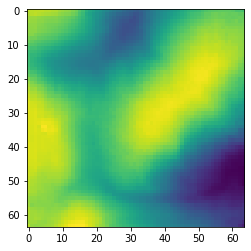

epoch[45/100], disc_loss=0.778, gen_loss=2.025


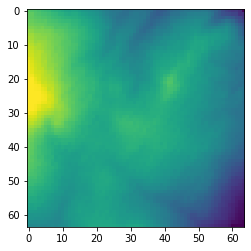

epoch[45/100], disc_loss=0.735, gen_loss=2.166


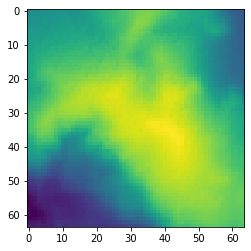

epoch[45/100], disc_loss=0.788, gen_loss=2.070


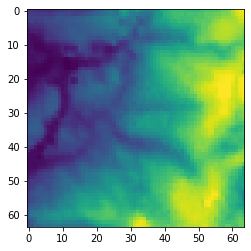

epoch[45/100], disc_loss=0.710, gen_loss=2.387


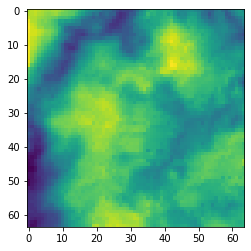

epoch[45/100], disc_loss=0.728, gen_loss=2.091


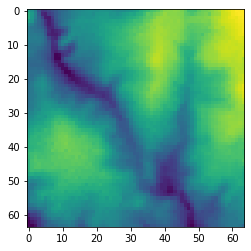

epoch[45/100], disc_loss=0.752, gen_loss=2.556


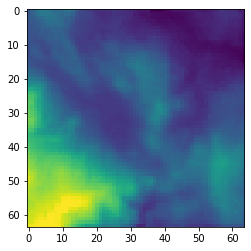

epoch[46/100], disc_loss=1.213, gen_loss=2.288


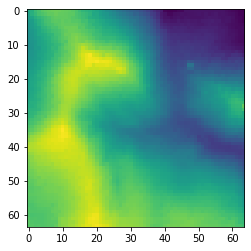

epoch[46/100], disc_loss=0.781, gen_loss=2.305


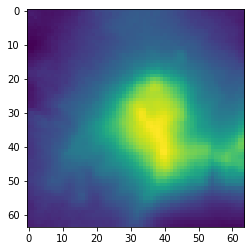

epoch[46/100], disc_loss=0.726, gen_loss=2.426


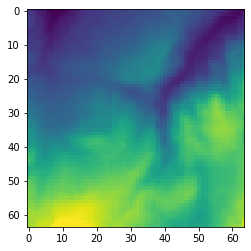

epoch[46/100], disc_loss=0.744, gen_loss=1.905


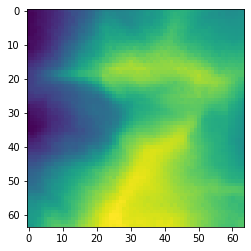

epoch[46/100], disc_loss=0.764, gen_loss=1.872


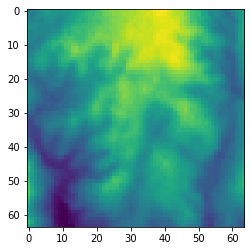

epoch[46/100], disc_loss=0.748, gen_loss=2.108


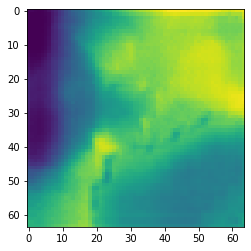

epoch[47/100], disc_loss=0.760, gen_loss=1.588


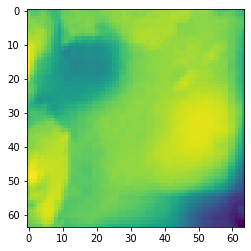

epoch[47/100], disc_loss=0.780, gen_loss=1.736


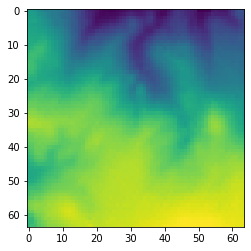

epoch[47/100], disc_loss=0.764, gen_loss=2.857


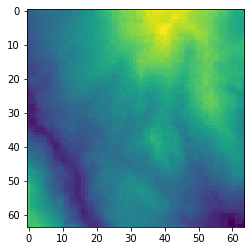

epoch[47/100], disc_loss=0.727, gen_loss=2.270


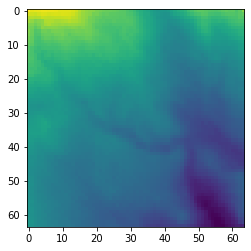

epoch[47/100], disc_loss=0.745, gen_loss=2.585


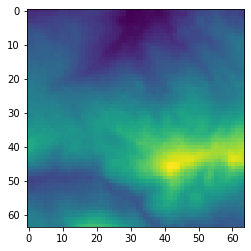

epoch[47/100], disc_loss=0.738, gen_loss=2.282


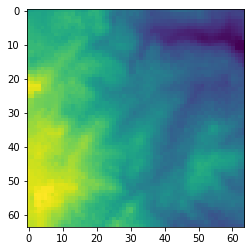

epoch[48/100], disc_loss=1.118, gen_loss=3.940


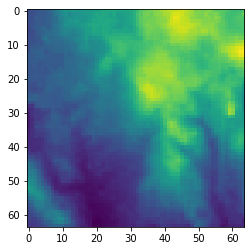

epoch[48/100], disc_loss=0.759, gen_loss=1.899


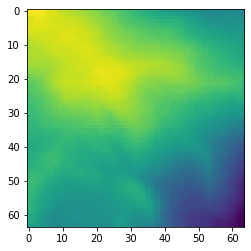

epoch[48/100], disc_loss=0.714, gen_loss=2.254


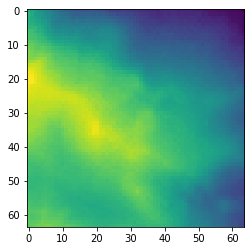

epoch[48/100], disc_loss=0.713, gen_loss=2.268


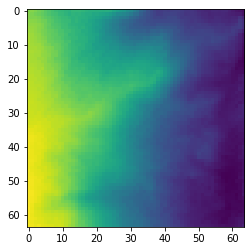

epoch[48/100], disc_loss=0.735, gen_loss=2.279


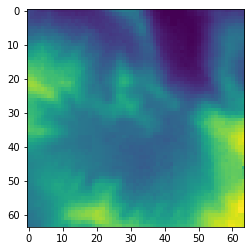

epoch[48/100], disc_loss=0.721, gen_loss=2.447


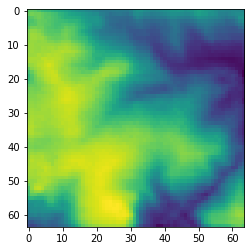

epoch[49/100], disc_loss=0.815, gen_loss=1.706


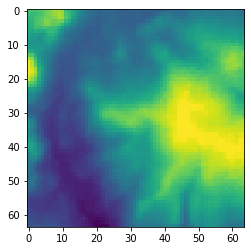

epoch[49/100], disc_loss=0.728, gen_loss=2.000


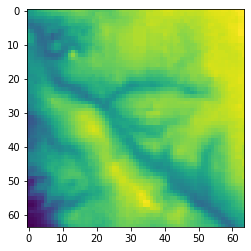

epoch[49/100], disc_loss=0.723, gen_loss=2.172


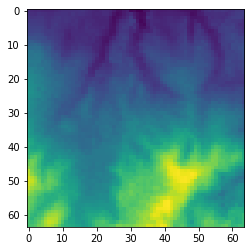

epoch[49/100], disc_loss=0.732, gen_loss=2.159


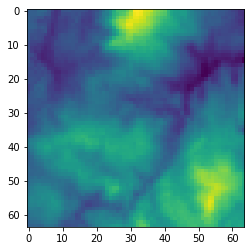

epoch[49/100], disc_loss=0.726, gen_loss=2.031


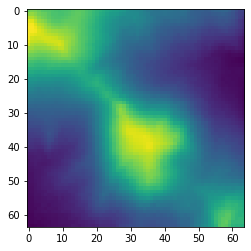

epoch[49/100], disc_loss=0.732, gen_loss=2.491


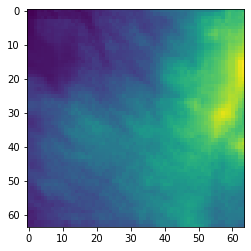

epoch[50/100], disc_loss=0.869, gen_loss=1.023


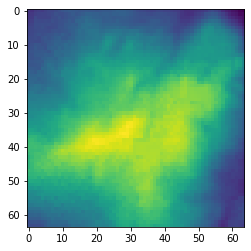

epoch[50/100], disc_loss=0.716, gen_loss=2.219


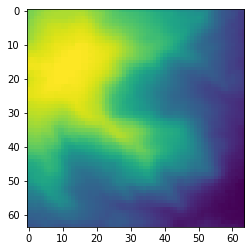

epoch[50/100], disc_loss=0.728, gen_loss=2.322


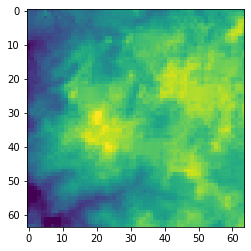

epoch[50/100], disc_loss=0.725, gen_loss=2.013


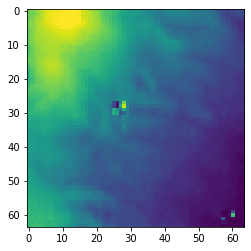

epoch[50/100], disc_loss=0.744, gen_loss=1.727


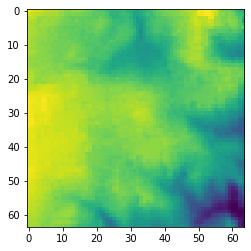

epoch[50/100], disc_loss=0.745, gen_loss=1.966


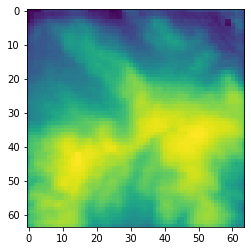

epoch[51/100], disc_loss=0.920, gen_loss=1.335


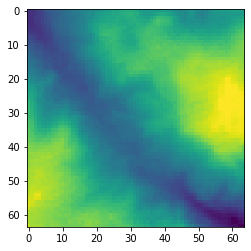

epoch[51/100], disc_loss=0.722, gen_loss=2.124


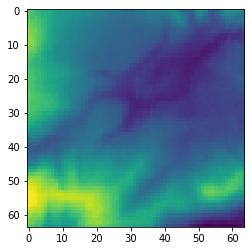

epoch[51/100], disc_loss=0.711, gen_loss=2.508


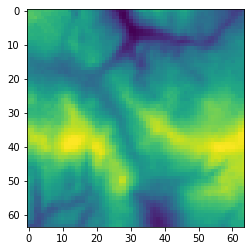

epoch[51/100], disc_loss=0.726, gen_loss=2.478


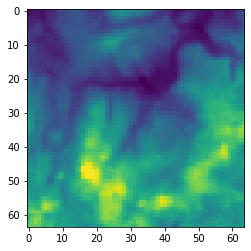

epoch[51/100], disc_loss=0.728, gen_loss=2.410


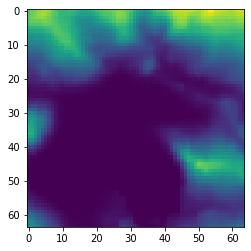

epoch[51/100], disc_loss=0.727, gen_loss=2.383


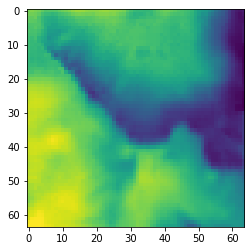

epoch[52/100], disc_loss=0.786, gen_loss=1.781


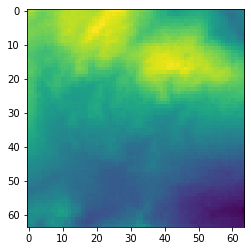

epoch[52/100], disc_loss=0.737, gen_loss=2.028


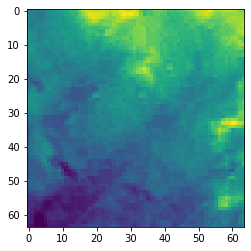

epoch[52/100], disc_loss=0.711, gen_loss=2.500


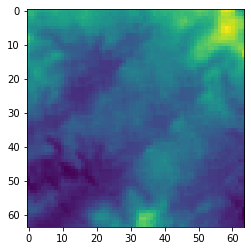

epoch[52/100], disc_loss=0.723, gen_loss=2.224


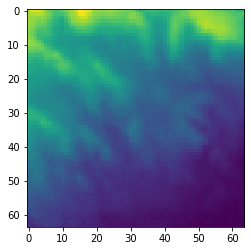

epoch[52/100], disc_loss=0.767, gen_loss=2.179


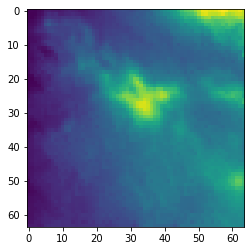

epoch[52/100], disc_loss=0.747, gen_loss=1.936


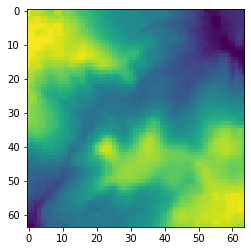

epoch[53/100], disc_loss=0.772, gen_loss=1.831


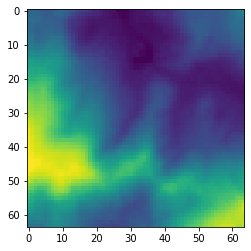

epoch[53/100], disc_loss=0.716, gen_loss=2.353


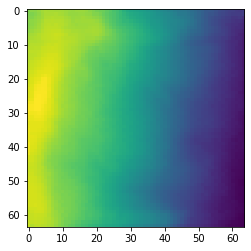

epoch[53/100], disc_loss=0.700, gen_loss=2.121


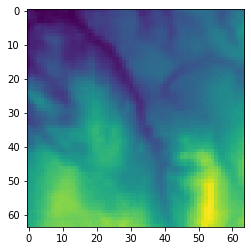

epoch[53/100], disc_loss=0.743, gen_loss=2.705


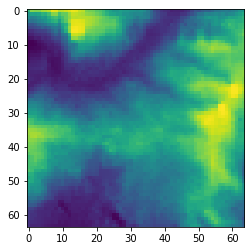

epoch[53/100], disc_loss=0.723, gen_loss=2.279


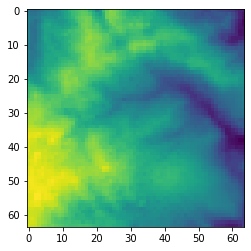

epoch[53/100], disc_loss=0.711, gen_loss=2.484


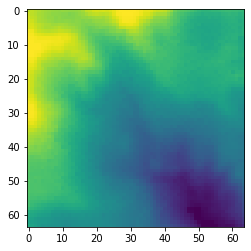

epoch[54/100], disc_loss=1.030, gen_loss=3.152


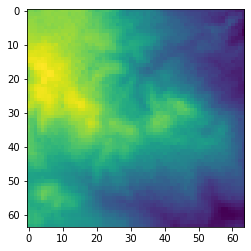

epoch[54/100], disc_loss=0.728, gen_loss=2.322


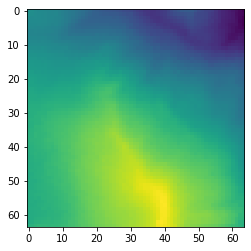

epoch[54/100], disc_loss=0.765, gen_loss=2.120


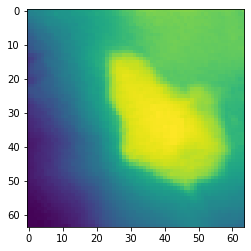

epoch[54/100], disc_loss=0.708, gen_loss=2.422


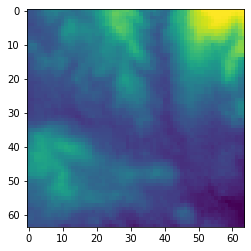

epoch[54/100], disc_loss=0.731, gen_loss=2.232


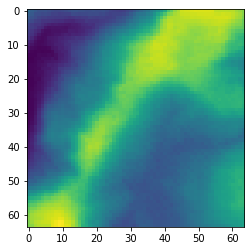

epoch[54/100], disc_loss=0.716, gen_loss=2.611


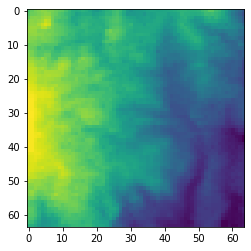

epoch[55/100], disc_loss=1.303, gen_loss=3.163


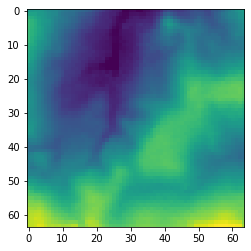

epoch[55/100], disc_loss=0.783, gen_loss=2.035


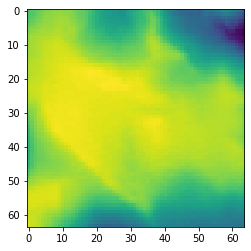

epoch[55/100], disc_loss=0.724, gen_loss=2.115


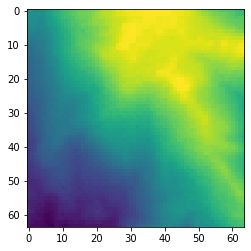

epoch[55/100], disc_loss=0.711, gen_loss=2.343


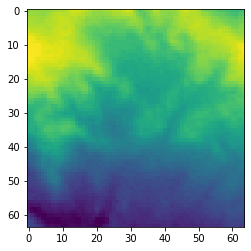

epoch[55/100], disc_loss=0.730, gen_loss=2.012


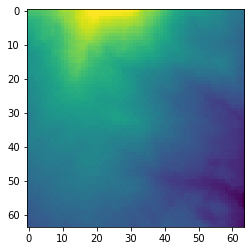

epoch[55/100], disc_loss=0.721, gen_loss=2.241


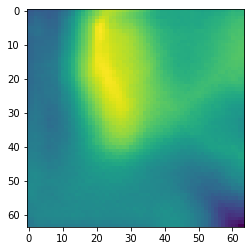

epoch[56/100], disc_loss=0.724, gen_loss=2.101


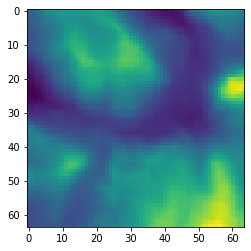

epoch[56/100], disc_loss=0.721, gen_loss=2.231


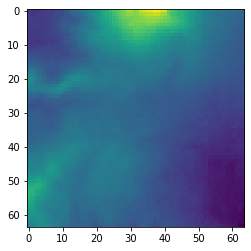

epoch[56/100], disc_loss=0.740, gen_loss=2.053


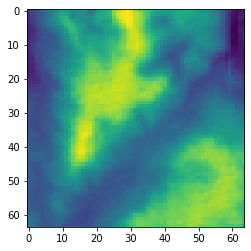

epoch[56/100], disc_loss=0.729, gen_loss=2.232


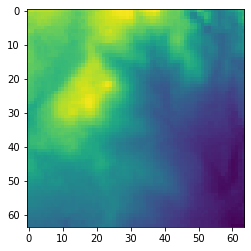

epoch[56/100], disc_loss=0.719, gen_loss=2.160


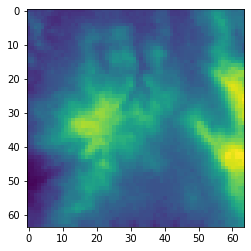

epoch[56/100], disc_loss=0.736, gen_loss=1.973


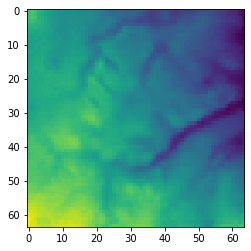

epoch[57/100], disc_loss=0.741, gen_loss=2.581


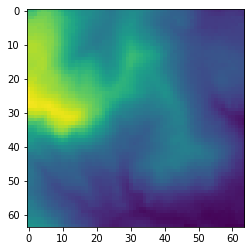

epoch[57/100], disc_loss=0.721, gen_loss=2.325


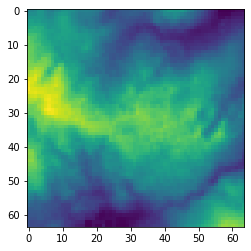

epoch[57/100], disc_loss=0.780, gen_loss=2.435


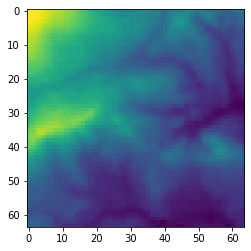

epoch[57/100], disc_loss=0.743, gen_loss=2.043


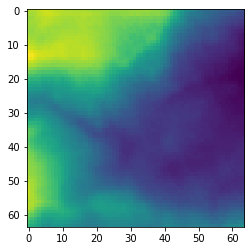

epoch[57/100], disc_loss=0.751, gen_loss=2.489


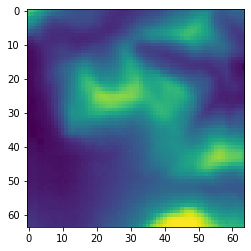

epoch[57/100], disc_loss=0.757, gen_loss=1.713


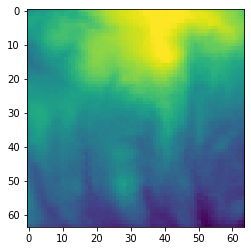

epoch[58/100], disc_loss=0.910, gen_loss=2.178


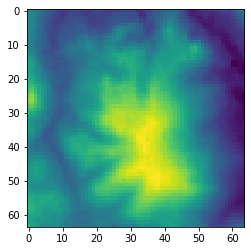

epoch[58/100], disc_loss=0.753, gen_loss=1.965


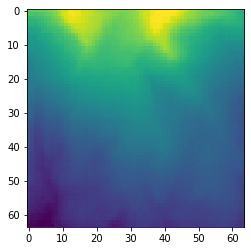

epoch[58/100], disc_loss=0.726, gen_loss=2.331


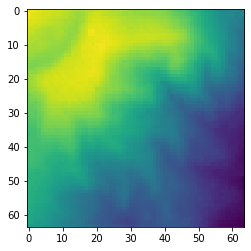

epoch[58/100], disc_loss=0.721, gen_loss=2.224


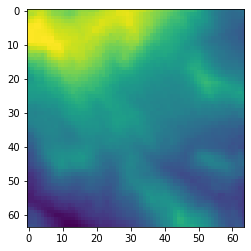

epoch[58/100], disc_loss=0.712, gen_loss=2.048


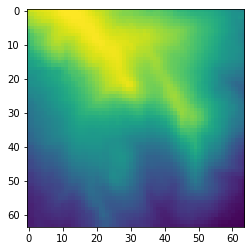

epoch[58/100], disc_loss=0.737, gen_loss=1.981


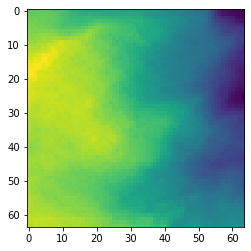

epoch[59/100], disc_loss=0.709, gen_loss=2.220


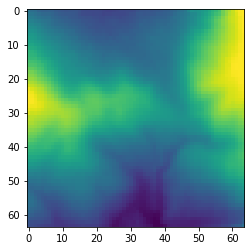

epoch[59/100], disc_loss=0.705, gen_loss=2.364


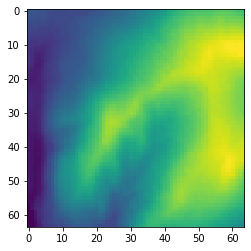

epoch[59/100], disc_loss=0.743, gen_loss=2.515


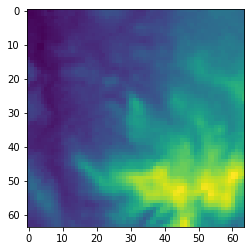

epoch[59/100], disc_loss=0.707, gen_loss=2.250


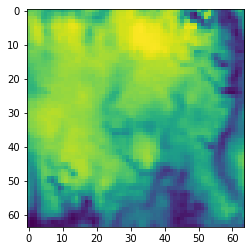

epoch[59/100], disc_loss=0.718, gen_loss=2.251


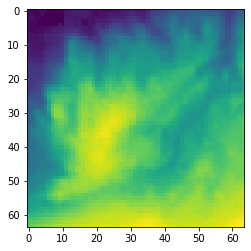

epoch[59/100], disc_loss=0.731, gen_loss=2.402


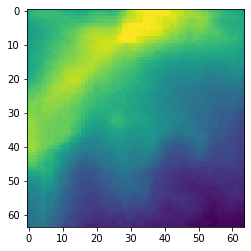

epoch[60/100], disc_loss=0.798, gen_loss=2.233


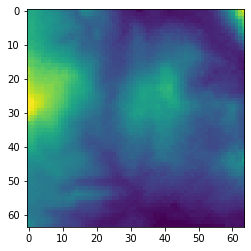

epoch[60/100], disc_loss=0.724, gen_loss=2.093


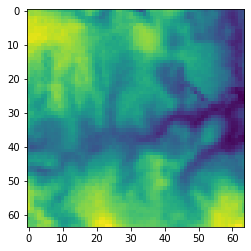

epoch[60/100], disc_loss=0.720, gen_loss=2.379


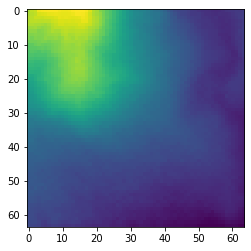

epoch[60/100], disc_loss=0.730, gen_loss=1.915


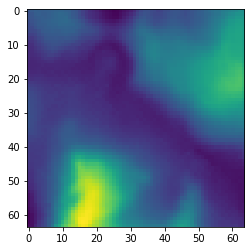

epoch[60/100], disc_loss=0.709, gen_loss=2.459


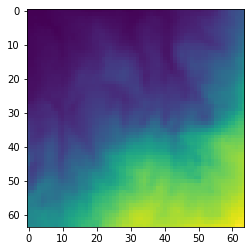

epoch[60/100], disc_loss=0.718, gen_loss=2.470


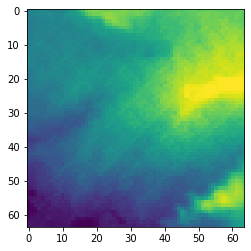

epoch[61/100], disc_loss=0.823, gen_loss=1.847


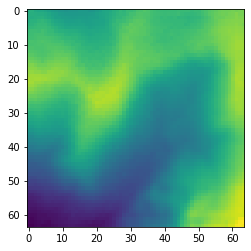

epoch[61/100], disc_loss=0.718, gen_loss=2.091


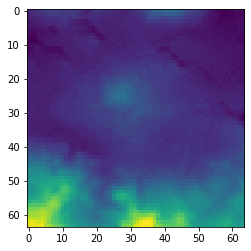

epoch[61/100], disc_loss=0.714, gen_loss=1.952


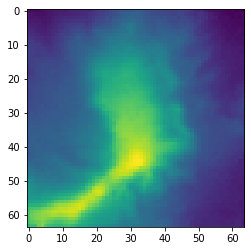

epoch[61/100], disc_loss=0.776, gen_loss=1.793


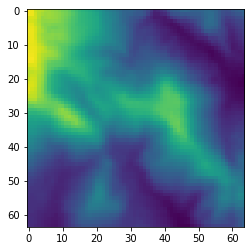

epoch[61/100], disc_loss=0.702, gen_loss=2.387


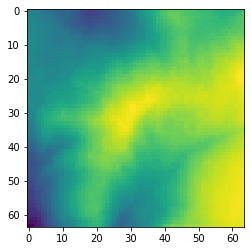

epoch[61/100], disc_loss=0.733, gen_loss=2.171


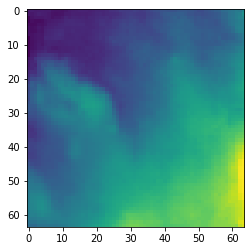

epoch[62/100], disc_loss=0.818, gen_loss=1.263


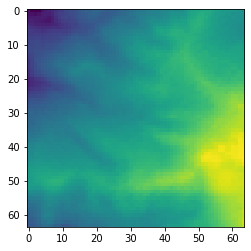

epoch[62/100], disc_loss=0.725, gen_loss=2.746


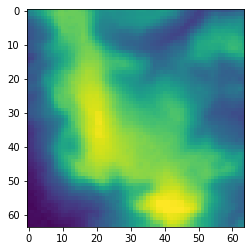

epoch[62/100], disc_loss=0.695, gen_loss=2.253


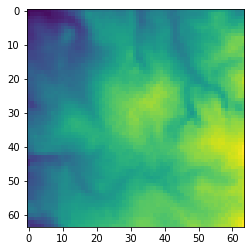

epoch[62/100], disc_loss=0.701, gen_loss=2.319


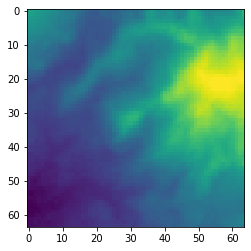

epoch[62/100], disc_loss=0.697, gen_loss=2.541


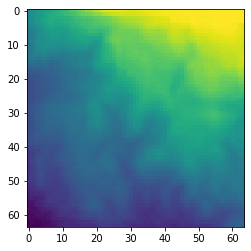

epoch[62/100], disc_loss=0.714, gen_loss=2.227


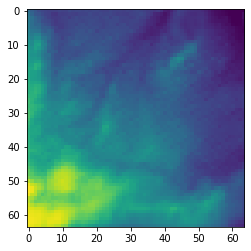

epoch[63/100], disc_loss=0.707, gen_loss=1.674


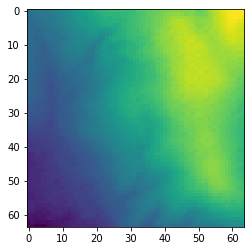

epoch[63/100], disc_loss=0.702, gen_loss=2.415


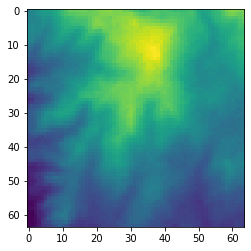

epoch[63/100], disc_loss=0.718, gen_loss=2.181


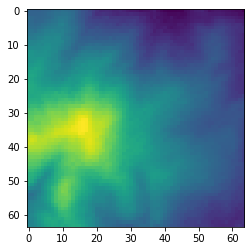

epoch[63/100], disc_loss=0.704, gen_loss=2.306


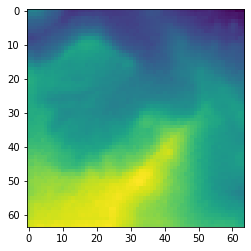

epoch[63/100], disc_loss=0.711, gen_loss=2.253


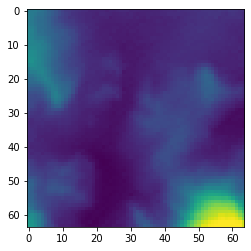

epoch[63/100], disc_loss=0.711, gen_loss=2.294


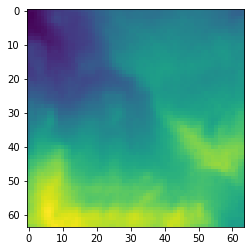

epoch[64/100], disc_loss=0.747, gen_loss=2.845


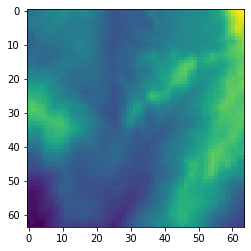

epoch[64/100], disc_loss=0.723, gen_loss=2.070


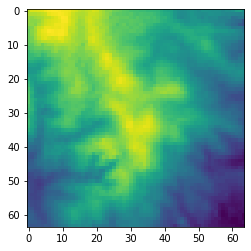

epoch[64/100], disc_loss=0.707, gen_loss=2.588


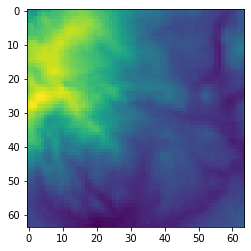

epoch[64/100], disc_loss=0.719, gen_loss=2.193


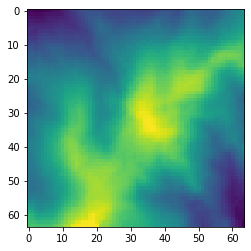

epoch[64/100], disc_loss=0.710, gen_loss=2.173


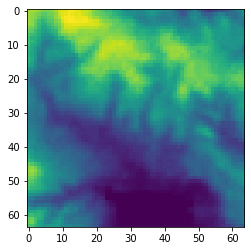

epoch[64/100], disc_loss=0.700, gen_loss=2.247


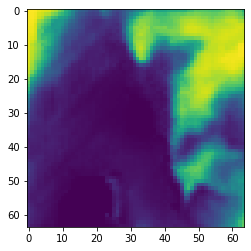

epoch[65/100], disc_loss=0.736, gen_loss=2.785


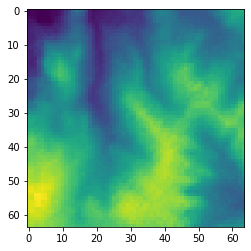

epoch[65/100], disc_loss=0.731, gen_loss=2.335


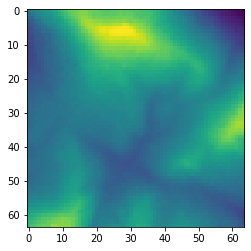

epoch[65/100], disc_loss=0.708, gen_loss=2.076


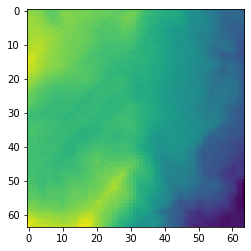

epoch[65/100], disc_loss=0.732, gen_loss=2.113


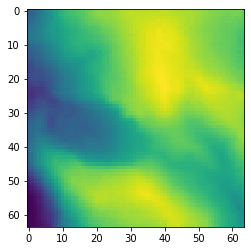

epoch[65/100], disc_loss=0.702, gen_loss=2.446


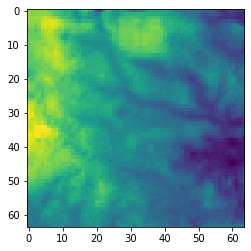

epoch[65/100], disc_loss=0.716, gen_loss=2.230


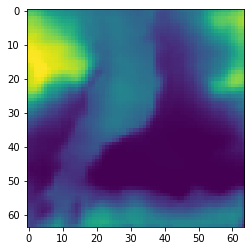

epoch[66/100], disc_loss=0.922, gen_loss=1.021


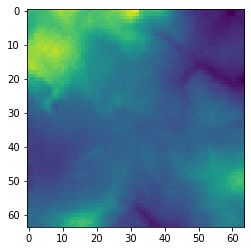

epoch[66/100], disc_loss=0.712, gen_loss=2.193


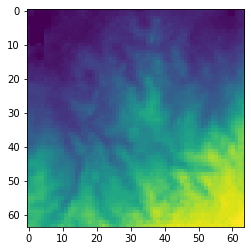

epoch[66/100], disc_loss=0.735, gen_loss=2.075


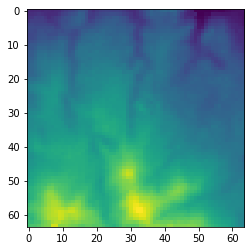

epoch[66/100], disc_loss=0.703, gen_loss=2.272


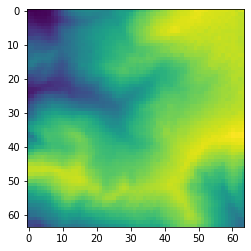

epoch[66/100], disc_loss=0.728, gen_loss=2.197


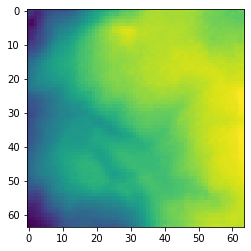

epoch[66/100], disc_loss=0.702, gen_loss=2.105


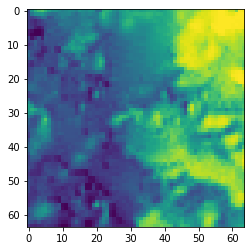

epoch[67/100], disc_loss=0.859, gen_loss=1.114


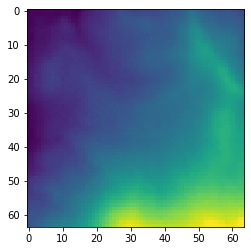

epoch[67/100], disc_loss=0.706, gen_loss=2.165


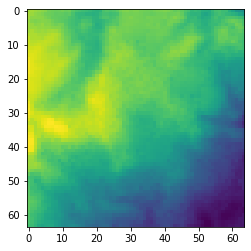

epoch[67/100], disc_loss=0.698, gen_loss=2.235


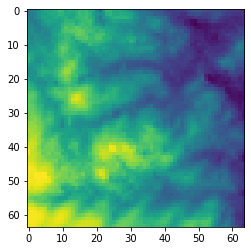

epoch[67/100], disc_loss=0.706, gen_loss=2.347


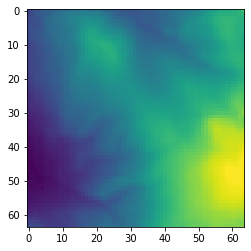

epoch[67/100], disc_loss=0.712, gen_loss=2.454


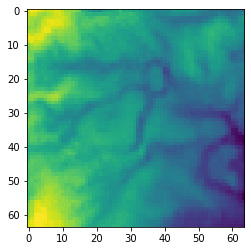

epoch[67/100], disc_loss=0.702, gen_loss=2.212


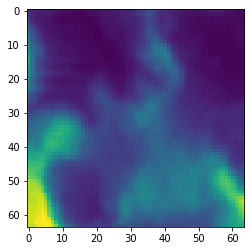

epoch[68/100], disc_loss=0.773, gen_loss=1.845


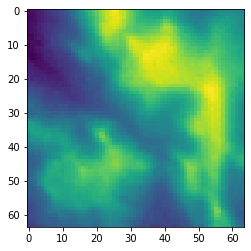

epoch[68/100], disc_loss=0.717, gen_loss=2.427


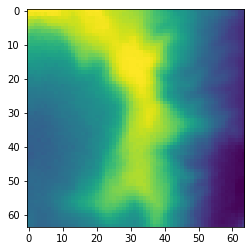

epoch[68/100], disc_loss=0.716, gen_loss=2.163


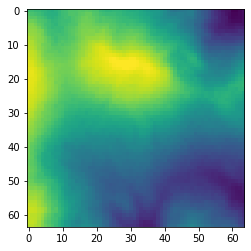

epoch[68/100], disc_loss=0.711, gen_loss=2.355


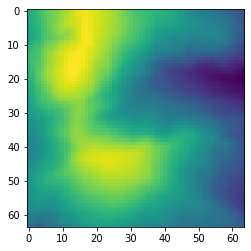

epoch[68/100], disc_loss=0.715, gen_loss=2.555


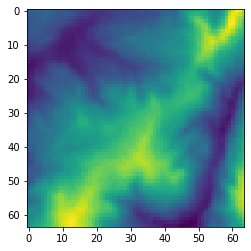

epoch[68/100], disc_loss=0.711, gen_loss=2.455


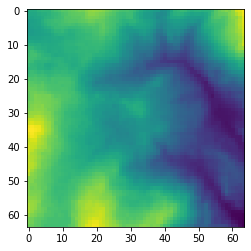

epoch[69/100], disc_loss=0.867, gen_loss=1.110


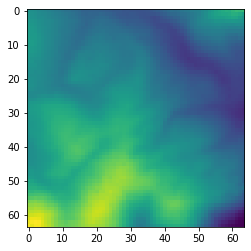

epoch[69/100], disc_loss=0.760, gen_loss=2.214


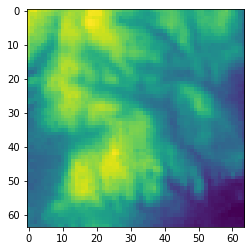

epoch[69/100], disc_loss=0.699, gen_loss=2.160


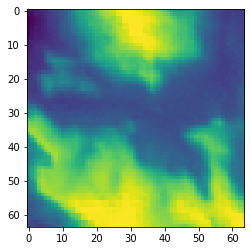

epoch[69/100], disc_loss=0.691, gen_loss=2.544


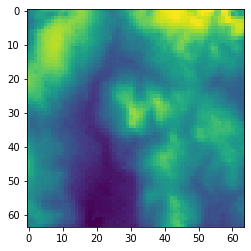

epoch[69/100], disc_loss=0.705, gen_loss=2.669


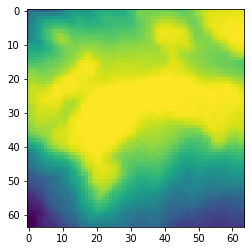

epoch[69/100], disc_loss=0.708, gen_loss=2.159


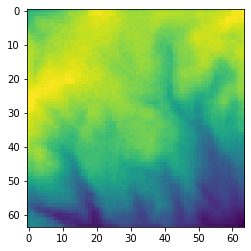

epoch[70/100], disc_loss=0.765, gen_loss=3.068


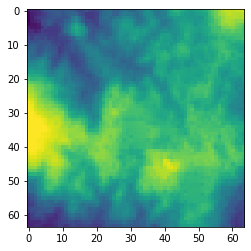

epoch[70/100], disc_loss=0.683, gen_loss=2.398


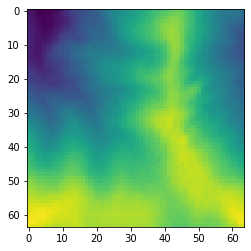

epoch[70/100], disc_loss=0.798, gen_loss=1.790


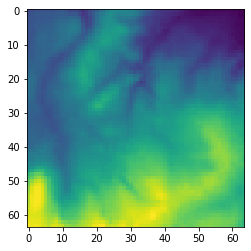

epoch[70/100], disc_loss=0.710, gen_loss=2.197


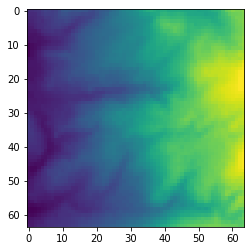

epoch[70/100], disc_loss=0.712, gen_loss=2.099


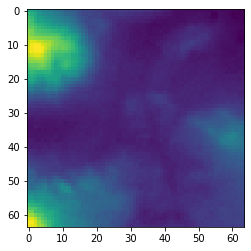

epoch[70/100], disc_loss=0.712, gen_loss=2.176


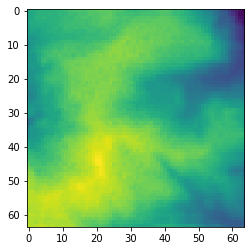

epoch[71/100], disc_loss=0.718, gen_loss=2.297


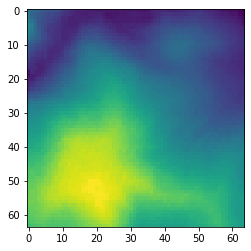

epoch[71/100], disc_loss=0.711, gen_loss=2.210


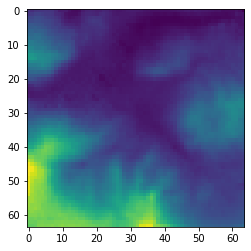

epoch[71/100], disc_loss=0.706, gen_loss=2.242


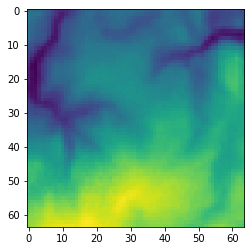

epoch[71/100], disc_loss=0.698, gen_loss=2.295


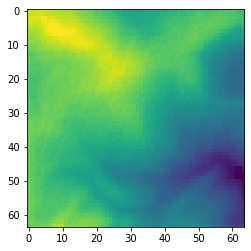

epoch[71/100], disc_loss=0.716, gen_loss=2.290


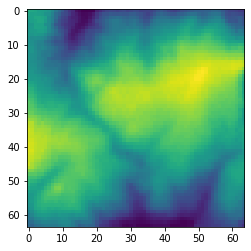

epoch[71/100], disc_loss=0.698, gen_loss=2.334


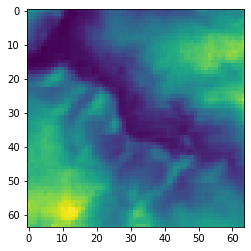

epoch[72/100], disc_loss=0.869, gen_loss=1.559


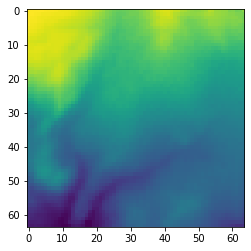

epoch[72/100], disc_loss=0.706, gen_loss=2.134


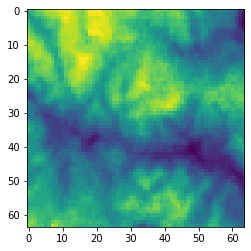

epoch[72/100], disc_loss=0.727, gen_loss=1.595


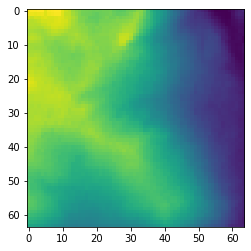

epoch[72/100], disc_loss=0.701, gen_loss=2.150


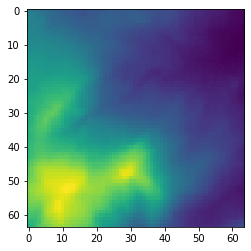

epoch[72/100], disc_loss=0.706, gen_loss=2.102


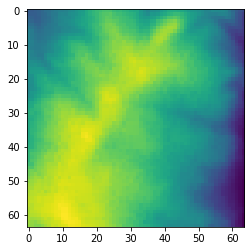

epoch[72/100], disc_loss=0.775, gen_loss=2.446


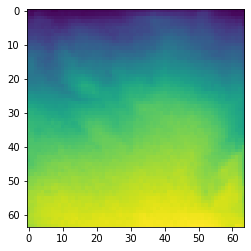

epoch[73/100], disc_loss=0.708, gen_loss=2.110


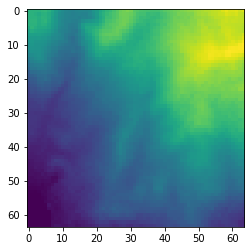

epoch[73/100], disc_loss=0.694, gen_loss=2.360


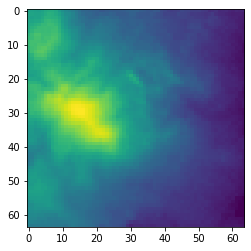

epoch[73/100], disc_loss=0.715, gen_loss=2.344


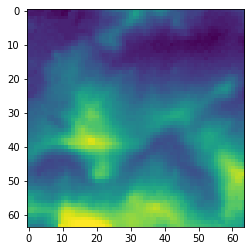

epoch[73/100], disc_loss=0.766, gen_loss=2.848


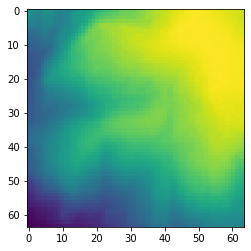

epoch[73/100], disc_loss=0.694, gen_loss=2.170


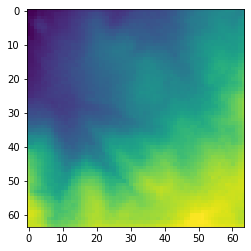

epoch[73/100], disc_loss=0.703, gen_loss=2.147


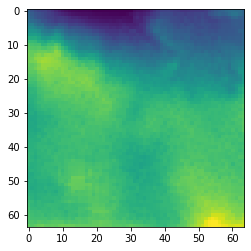

epoch[74/100], disc_loss=1.179, gen_loss=0.582


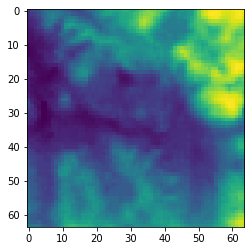

epoch[74/100], disc_loss=0.706, gen_loss=2.408


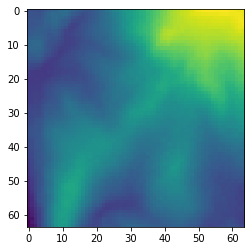

epoch[74/100], disc_loss=0.698, gen_loss=2.523


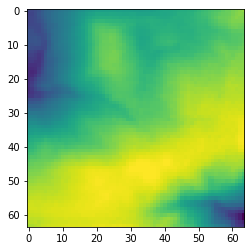

epoch[74/100], disc_loss=0.717, gen_loss=1.965


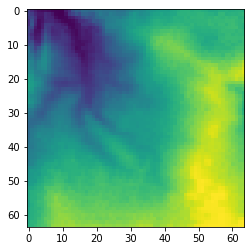

epoch[74/100], disc_loss=0.706, gen_loss=2.265


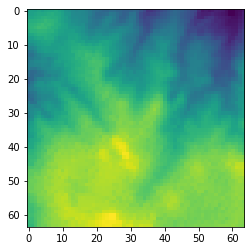

epoch[74/100], disc_loss=0.700, gen_loss=2.212


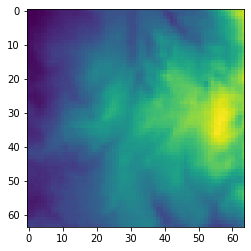

epoch[75/100], disc_loss=0.818, gen_loss=0.868


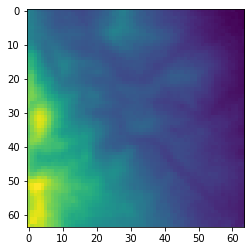

epoch[75/100], disc_loss=0.712, gen_loss=2.332


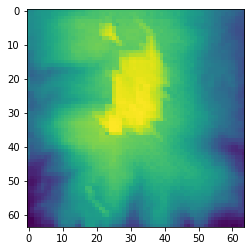

epoch[75/100], disc_loss=0.679, gen_loss=2.277


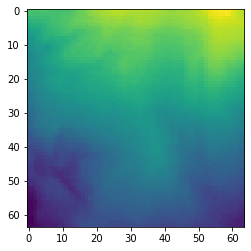

epoch[75/100], disc_loss=0.693, gen_loss=2.329


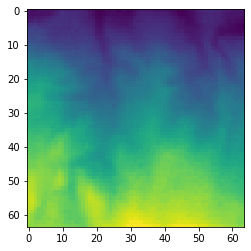

epoch[75/100], disc_loss=0.703, gen_loss=2.269


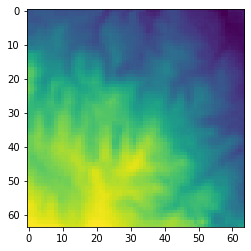

epoch[75/100], disc_loss=0.696, gen_loss=2.421


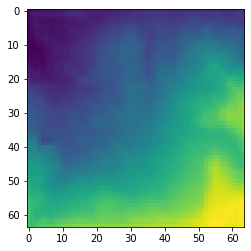

epoch[76/100], disc_loss=0.900, gen_loss=0.990


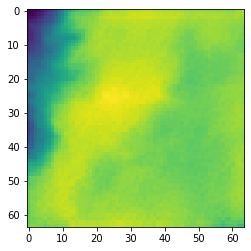

epoch[76/100], disc_loss=0.716, gen_loss=2.698


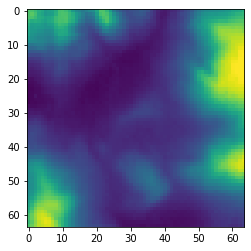

epoch[76/100], disc_loss=0.698, gen_loss=2.347


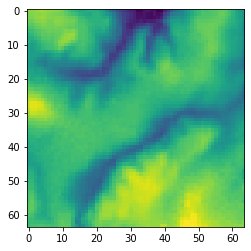

epoch[76/100], disc_loss=0.686, gen_loss=2.327


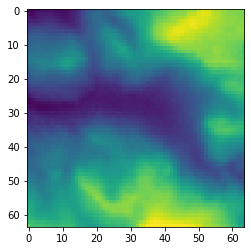

epoch[76/100], disc_loss=0.711, gen_loss=2.178


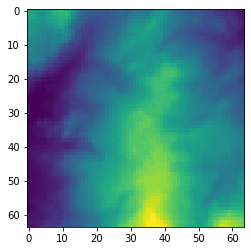

epoch[76/100], disc_loss=0.695, gen_loss=2.392


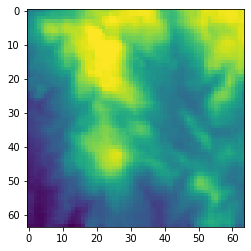

epoch[77/100], disc_loss=0.701, gen_loss=2.493


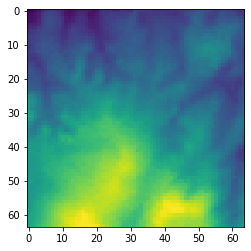

epoch[77/100], disc_loss=0.715, gen_loss=2.042


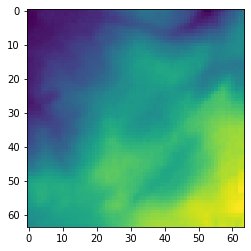

epoch[77/100], disc_loss=0.704, gen_loss=2.376


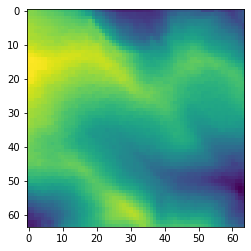

epoch[77/100], disc_loss=0.781, gen_loss=3.014


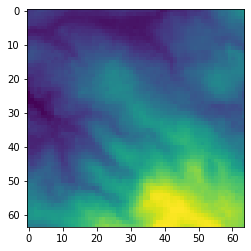

epoch[77/100], disc_loss=0.695, gen_loss=2.437


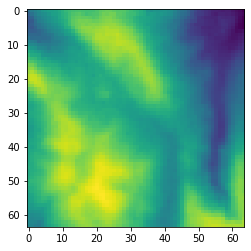

epoch[77/100], disc_loss=0.706, gen_loss=2.243


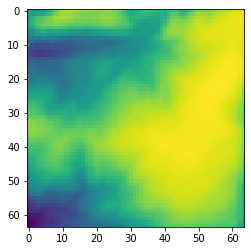

epoch[78/100], disc_loss=0.763, gen_loss=3.084


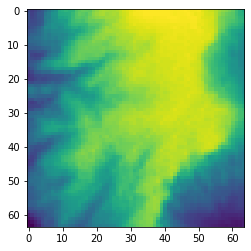

epoch[78/100], disc_loss=0.710, gen_loss=2.259


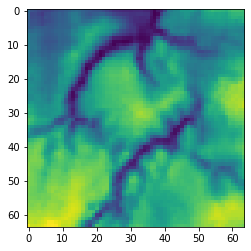

epoch[78/100], disc_loss=0.712, gen_loss=2.297


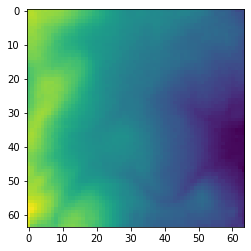

epoch[78/100], disc_loss=0.704, gen_loss=2.177


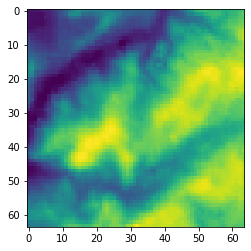

epoch[78/100], disc_loss=0.818, gen_loss=1.722


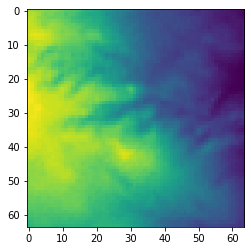

epoch[78/100], disc_loss=0.692, gen_loss=2.458


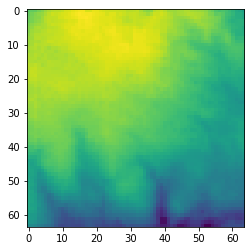

epoch[79/100], disc_loss=0.836, gen_loss=1.315


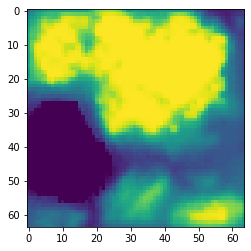

epoch[79/100], disc_loss=0.707, gen_loss=2.178


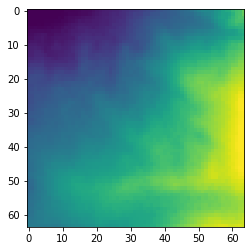

epoch[79/100], disc_loss=0.709, gen_loss=2.271


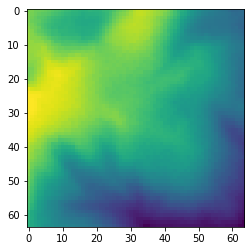

epoch[79/100], disc_loss=0.752, gen_loss=2.059


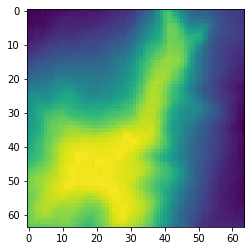

epoch[79/100], disc_loss=0.700, gen_loss=2.297


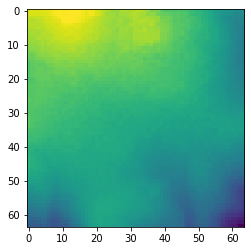

epoch[79/100], disc_loss=0.699, gen_loss=2.219


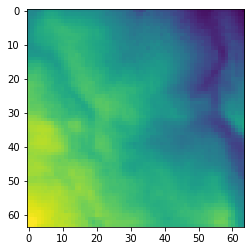

epoch[80/100], disc_loss=0.812, gen_loss=1.058


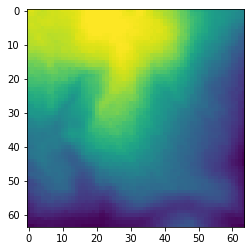

epoch[80/100], disc_loss=0.717, gen_loss=2.413


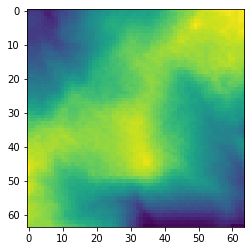

epoch[80/100], disc_loss=0.717, gen_loss=2.347


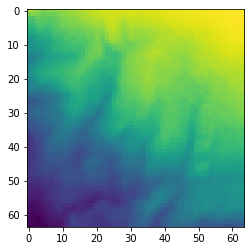

epoch[80/100], disc_loss=0.698, gen_loss=2.450


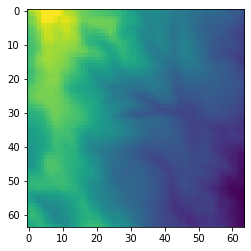

epoch[80/100], disc_loss=0.700, gen_loss=2.408


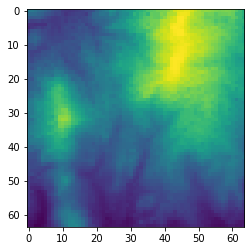

epoch[80/100], disc_loss=0.737, gen_loss=2.281


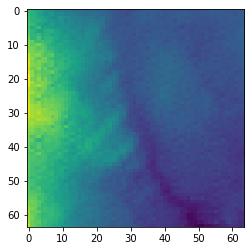

epoch[81/100], disc_loss=0.769, gen_loss=2.658


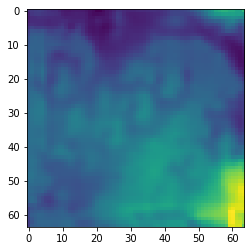

epoch[81/100], disc_loss=0.686, gen_loss=2.387


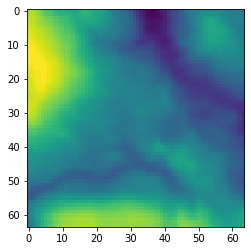

epoch[81/100], disc_loss=0.678, gen_loss=2.124


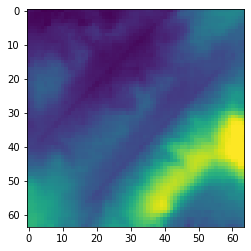

epoch[81/100], disc_loss=0.703, gen_loss=2.130


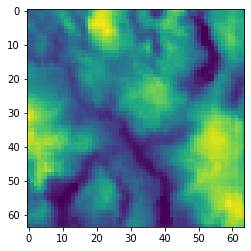

epoch[81/100], disc_loss=0.691, gen_loss=2.407


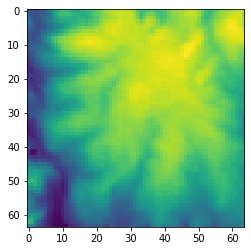

epoch[81/100], disc_loss=0.703, gen_loss=2.301


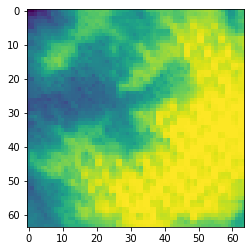

epoch[82/100], disc_loss=0.682, gen_loss=2.274


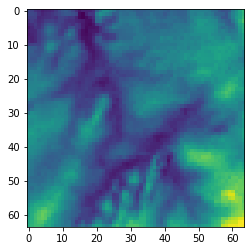

epoch[82/100], disc_loss=0.701, gen_loss=2.262


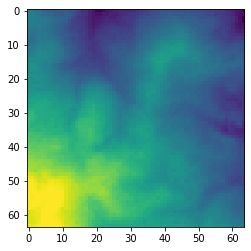

epoch[82/100], disc_loss=0.686, gen_loss=2.311


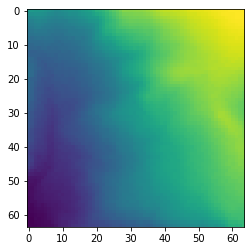

epoch[82/100], disc_loss=0.687, gen_loss=2.348


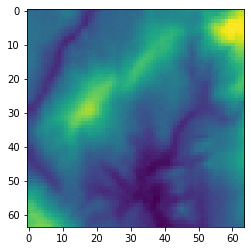

epoch[82/100], disc_loss=0.716, gen_loss=2.311


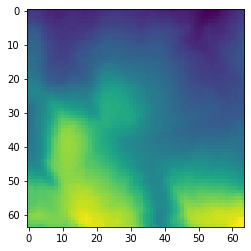

epoch[82/100], disc_loss=0.698, gen_loss=2.139


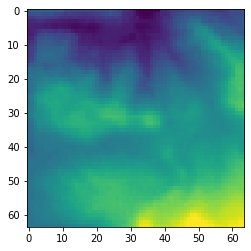

epoch[83/100], disc_loss=0.730, gen_loss=1.911


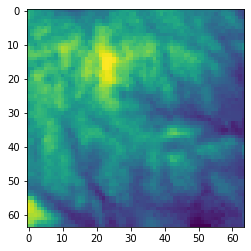

epoch[83/100], disc_loss=0.692, gen_loss=2.326


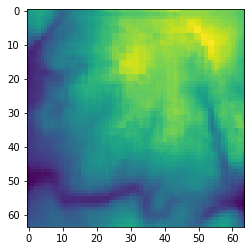

epoch[83/100], disc_loss=0.691, gen_loss=2.403


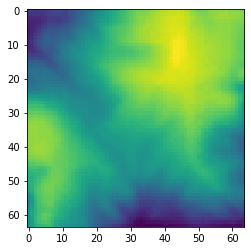

epoch[83/100], disc_loss=0.727, gen_loss=2.603


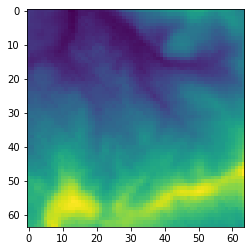

epoch[83/100], disc_loss=0.942, gen_loss=1.993


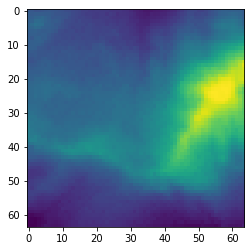

epoch[83/100], disc_loss=0.688, gen_loss=2.376


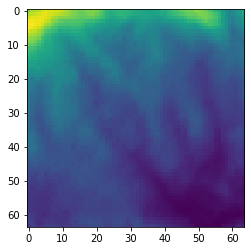

epoch[84/100], disc_loss=0.712, gen_loss=2.275


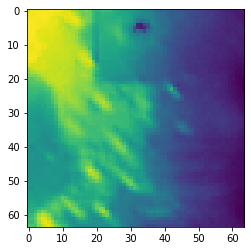

epoch[84/100], disc_loss=0.707, gen_loss=2.316


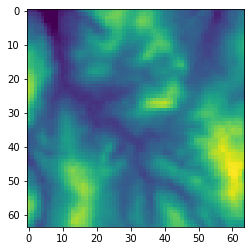

epoch[84/100], disc_loss=0.701, gen_loss=2.237


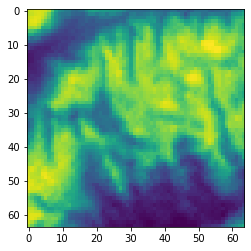

epoch[84/100], disc_loss=0.719, gen_loss=2.722


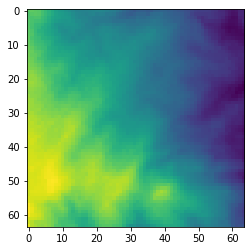

epoch[84/100], disc_loss=0.690, gen_loss=2.200


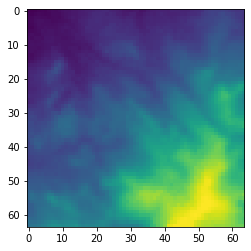

epoch[84/100], disc_loss=0.694, gen_loss=2.360


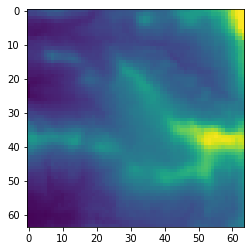

epoch[85/100], disc_loss=0.703, gen_loss=2.352


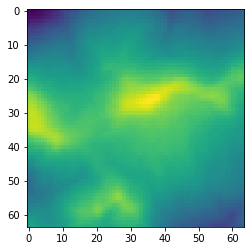

epoch[85/100], disc_loss=0.685, gen_loss=2.492


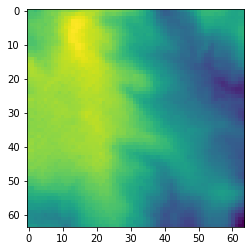

epoch[85/100], disc_loss=0.701, gen_loss=2.148


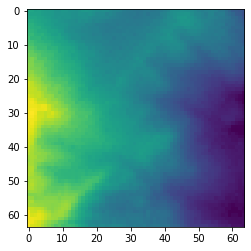

epoch[85/100], disc_loss=0.725, gen_loss=1.878


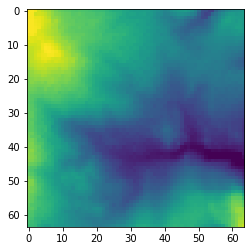

epoch[85/100], disc_loss=0.697, gen_loss=2.121


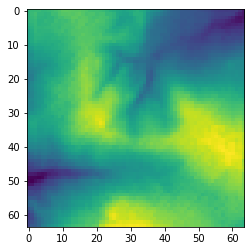

epoch[85/100], disc_loss=0.719, gen_loss=2.191


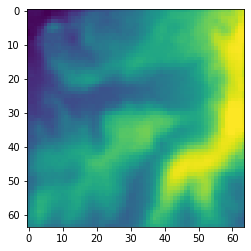

epoch[86/100], disc_loss=0.746, gen_loss=2.573


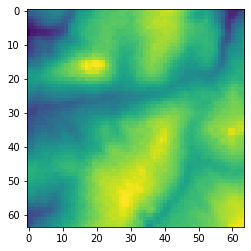

epoch[86/100], disc_loss=0.694, gen_loss=2.256


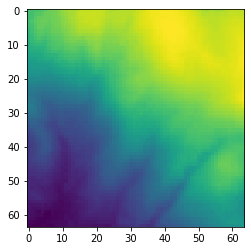

epoch[86/100], disc_loss=0.720, gen_loss=1.830


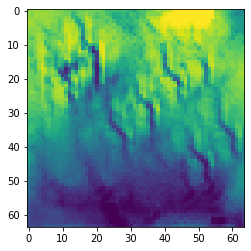

epoch[86/100], disc_loss=0.696, gen_loss=2.049


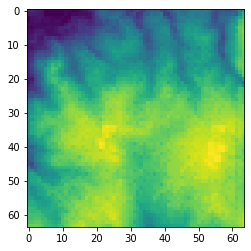

epoch[86/100], disc_loss=0.726, gen_loss=2.161


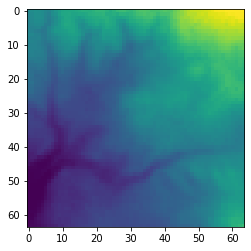

epoch[86/100], disc_loss=0.691, gen_loss=2.330


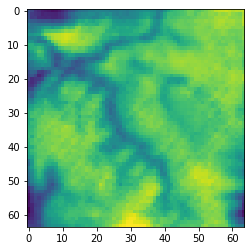

epoch[87/100], disc_loss=0.841, gen_loss=3.459


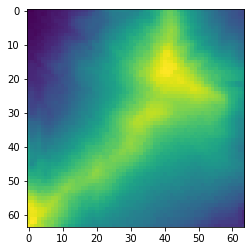

epoch[87/100], disc_loss=0.711, gen_loss=2.452


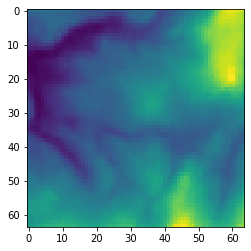

epoch[87/100], disc_loss=0.695, gen_loss=2.140


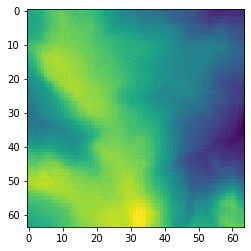

epoch[87/100], disc_loss=0.689, gen_loss=2.324


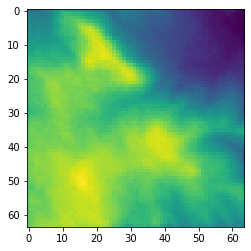

epoch[87/100], disc_loss=0.699, gen_loss=2.367


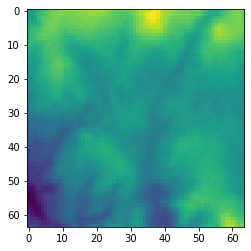

epoch[87/100], disc_loss=0.699, gen_loss=2.161


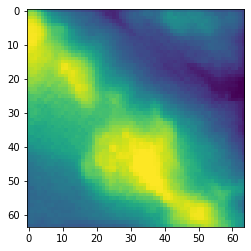

epoch[88/100], disc_loss=0.969, gen_loss=3.571


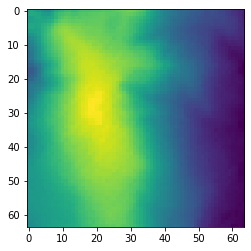

epoch[88/100], disc_loss=0.698, gen_loss=2.207


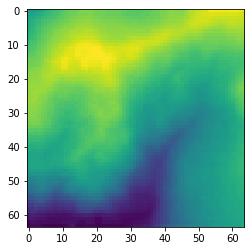

epoch[88/100], disc_loss=0.678, gen_loss=2.324


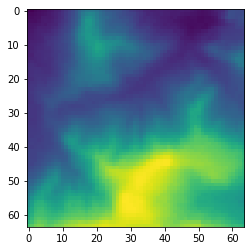

epoch[88/100], disc_loss=0.678, gen_loss=2.424


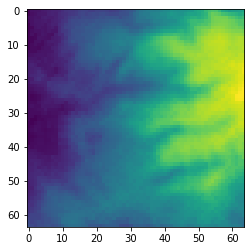

epoch[88/100], disc_loss=0.687, gen_loss=2.329


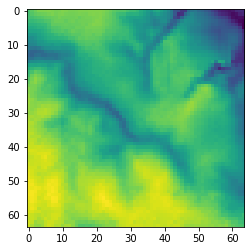

epoch[88/100], disc_loss=0.712, gen_loss=2.427


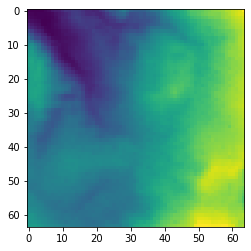

epoch[89/100], disc_loss=1.214, gen_loss=1.100


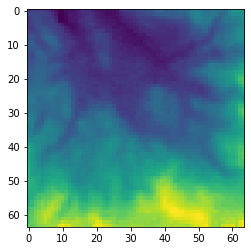

epoch[89/100], disc_loss=0.693, gen_loss=2.224


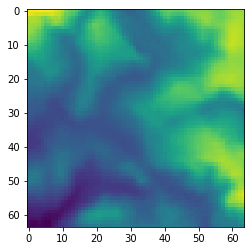

epoch[89/100], disc_loss=0.700, gen_loss=2.106


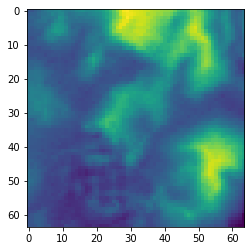

epoch[89/100], disc_loss=0.696, gen_loss=2.435


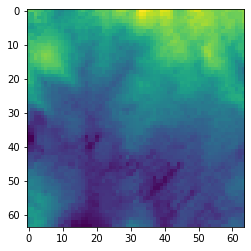

epoch[89/100], disc_loss=0.699, gen_loss=2.083


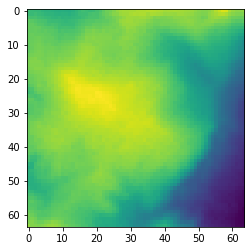

epoch[89/100], disc_loss=0.693, gen_loss=2.201


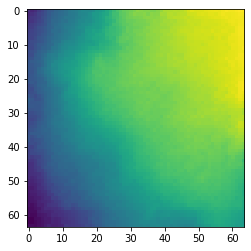

epoch[90/100], disc_loss=0.698, gen_loss=2.154


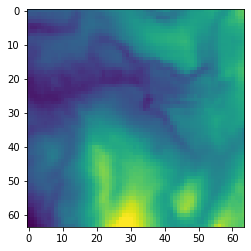

epoch[90/100], disc_loss=0.705, gen_loss=2.194


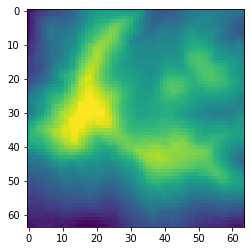

epoch[90/100], disc_loss=0.689, gen_loss=2.202


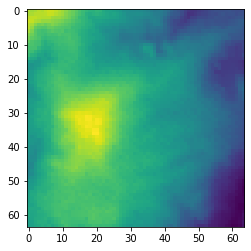

epoch[90/100], disc_loss=0.684, gen_loss=2.197


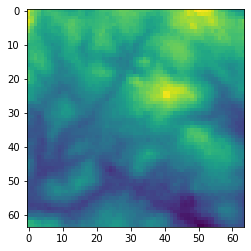

epoch[90/100], disc_loss=0.682, gen_loss=2.308


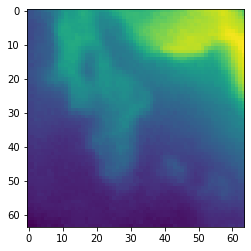

epoch[90/100], disc_loss=0.820, gen_loss=2.700


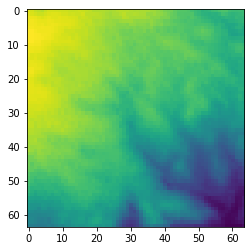

epoch[91/100], disc_loss=1.397, gen_loss=1.128


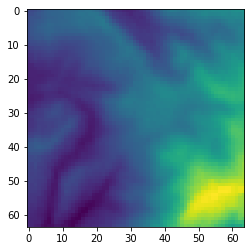

epoch[91/100], disc_loss=0.690, gen_loss=2.329


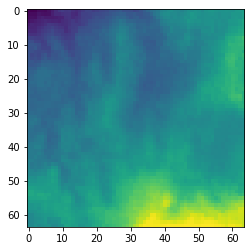

epoch[91/100], disc_loss=0.694, gen_loss=2.318


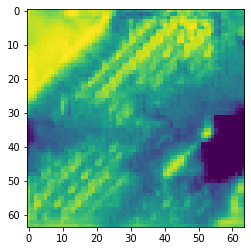

epoch[91/100], disc_loss=0.682, gen_loss=2.306


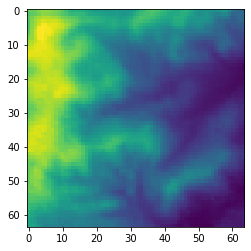

epoch[91/100], disc_loss=0.752, gen_loss=1.919


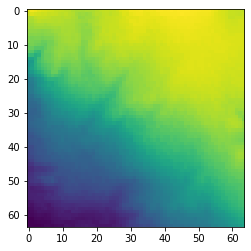

epoch[91/100], disc_loss=0.717, gen_loss=2.174


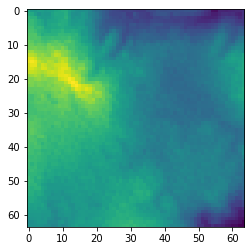

epoch[92/100], disc_loss=0.735, gen_loss=2.740


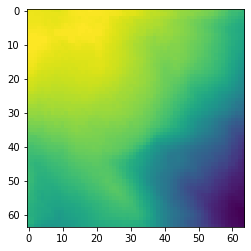

epoch[92/100], disc_loss=0.694, gen_loss=2.218


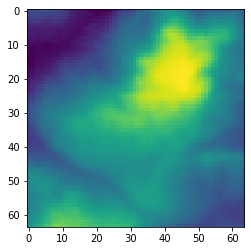

epoch[92/100], disc_loss=0.685, gen_loss=2.403


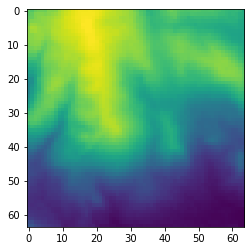

epoch[92/100], disc_loss=0.724, gen_loss=2.254


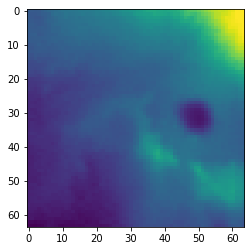

epoch[92/100], disc_loss=0.690, gen_loss=2.363


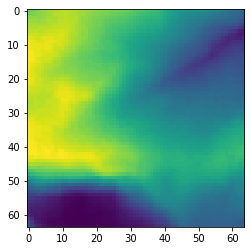

epoch[92/100], disc_loss=0.735, gen_loss=2.106


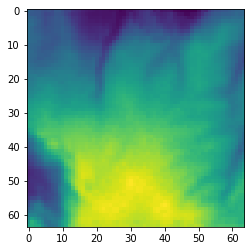

epoch[93/100], disc_loss=0.885, gen_loss=1.562


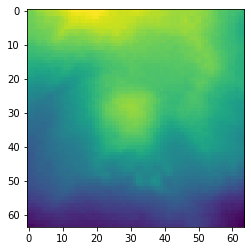

epoch[93/100], disc_loss=0.692, gen_loss=2.403


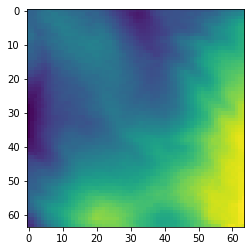

epoch[93/100], disc_loss=0.698, gen_loss=2.340


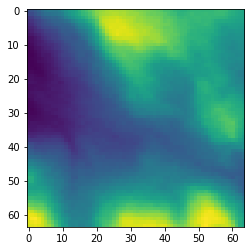

epoch[93/100], disc_loss=0.698, gen_loss=2.469


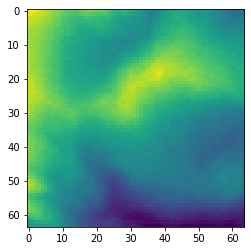

epoch[93/100], disc_loss=0.701, gen_loss=2.295


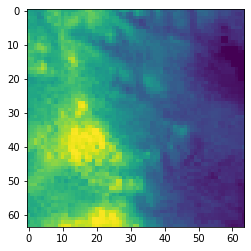

epoch[93/100], disc_loss=0.689, gen_loss=2.287


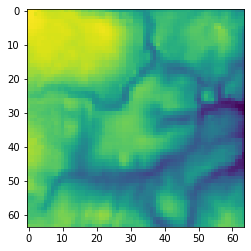

epoch[94/100], disc_loss=0.720, gen_loss=2.255


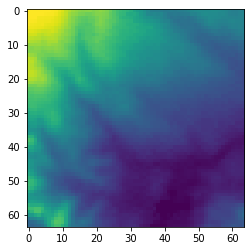

epoch[94/100], disc_loss=0.685, gen_loss=2.471


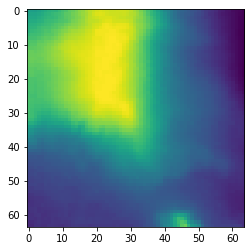

epoch[94/100], disc_loss=0.734, gen_loss=2.852


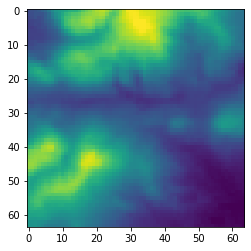

epoch[94/100], disc_loss=0.676, gen_loss=2.322


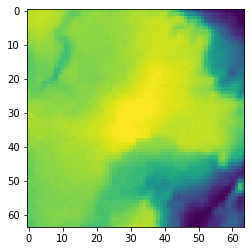

epoch[94/100], disc_loss=0.695, gen_loss=2.341


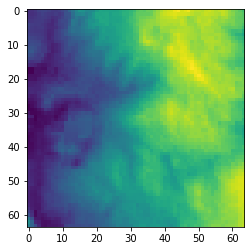

epoch[94/100], disc_loss=0.717, gen_loss=2.609


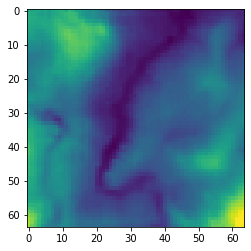

epoch[95/100], disc_loss=0.708, gen_loss=2.028


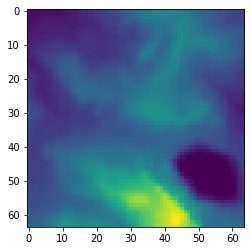

epoch[95/100], disc_loss=0.685, gen_loss=2.359


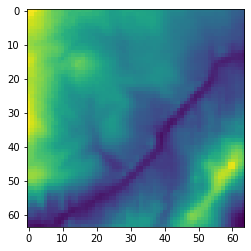

epoch[95/100], disc_loss=0.734, gen_loss=2.606


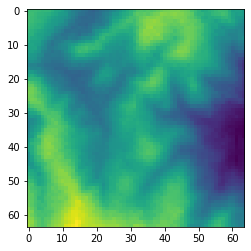

epoch[95/100], disc_loss=0.693, gen_loss=2.297


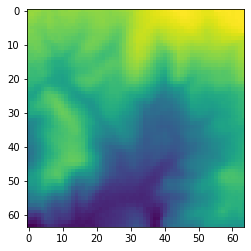

epoch[95/100], disc_loss=0.685, gen_loss=2.330


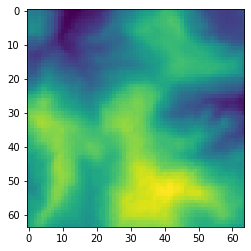

epoch[95/100], disc_loss=0.685, gen_loss=2.339


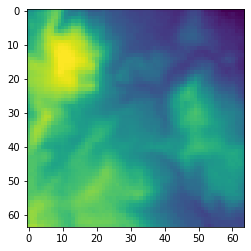

epoch[96/100], disc_loss=0.689, gen_loss=2.168


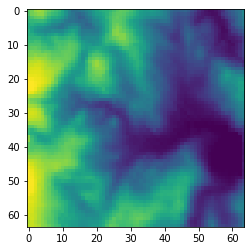

epoch[96/100], disc_loss=0.682, gen_loss=2.211


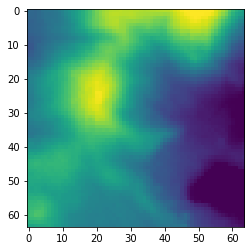

epoch[96/100], disc_loss=0.677, gen_loss=2.186


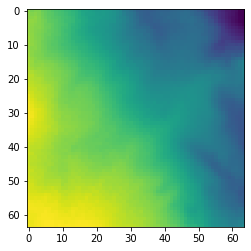

epoch[96/100], disc_loss=0.720, gen_loss=2.265


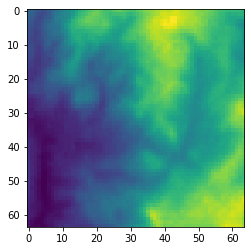

epoch[96/100], disc_loss=0.684, gen_loss=2.418


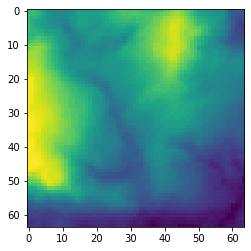

epoch[96/100], disc_loss=0.818, gen_loss=1.991


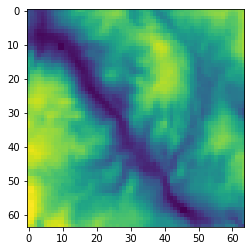

epoch[97/100], disc_loss=0.700, gen_loss=2.240


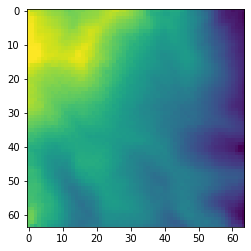

epoch[97/100], disc_loss=0.757, gen_loss=2.616


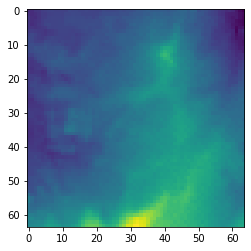

epoch[97/100], disc_loss=0.691, gen_loss=2.364


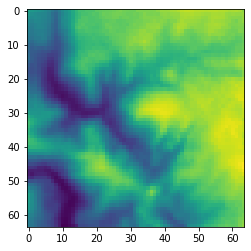

epoch[97/100], disc_loss=0.699, gen_loss=2.149


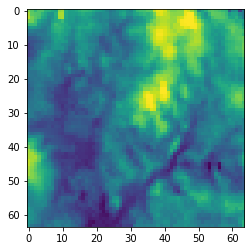

epoch[97/100], disc_loss=0.680, gen_loss=2.366


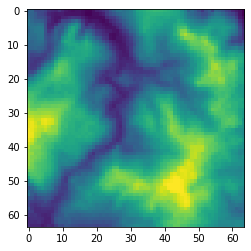

epoch[97/100], disc_loss=0.686, gen_loss=2.300


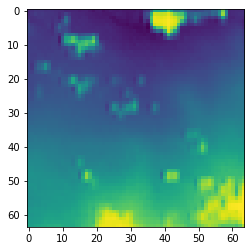

epoch[98/100], disc_loss=0.693, gen_loss=2.218


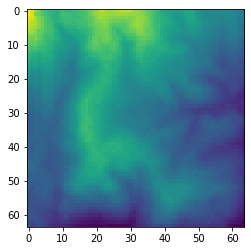

epoch[98/100], disc_loss=0.709, gen_loss=2.409


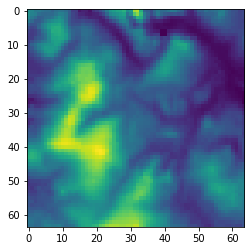

epoch[98/100], disc_loss=0.690, gen_loss=2.219


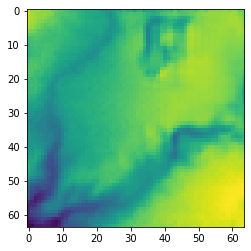

epoch[98/100], disc_loss=0.686, gen_loss=2.365


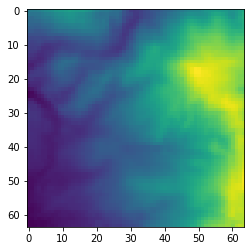

epoch[98/100], disc_loss=0.720, gen_loss=2.069


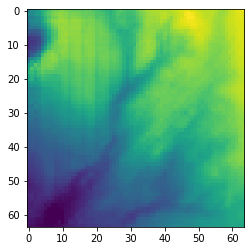

epoch[98/100], disc_loss=0.686, gen_loss=2.458


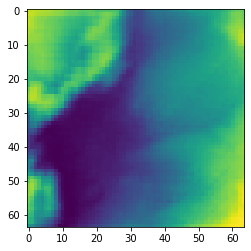

epoch[99/100], disc_loss=0.687, gen_loss=2.376


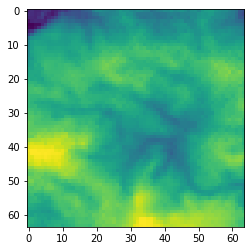

epoch[99/100], disc_loss=0.693, gen_loss=2.162


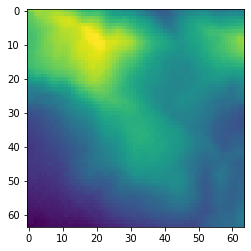

epoch[99/100], disc_loss=0.818, gen_loss=2.387


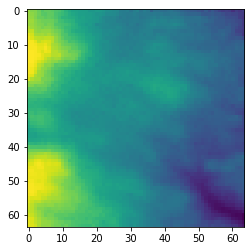

epoch[99/100], disc_loss=0.708, gen_loss=2.271


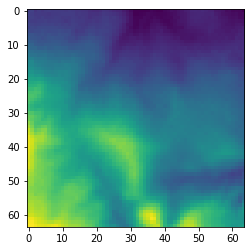

epoch[99/100], disc_loss=0.684, gen_loss=2.296


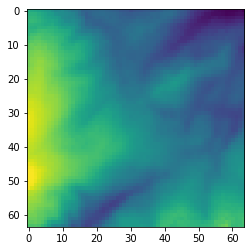

epoch[99/100], disc_loss=0.689, gen_loss=2.277


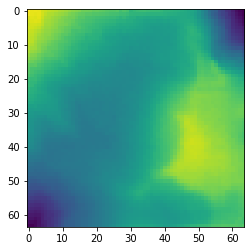

epoch[100/100], disc_loss=0.717, gen_loss=2.905


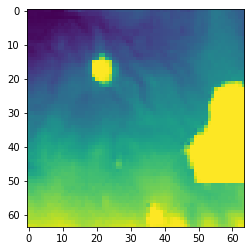

epoch[100/100], disc_loss=0.674, gen_loss=2.366


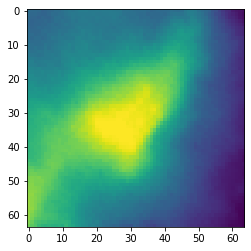

epoch[100/100], disc_loss=0.691, gen_loss=2.202


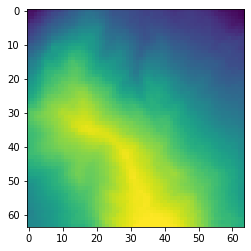

epoch[100/100], disc_loss=0.689, gen_loss=1.987


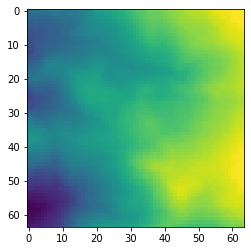

epoch[100/100], disc_loss=0.684, gen_loss=2.278


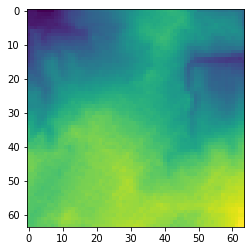

epoch[100/100], disc_loss=0.695, gen_loss=2.255


In [355]:
disc.train()
gen.train()

epochs = 100

loss_func = nn.BCELoss()

for epoch in range(epochs):
    for i, data in enumerate(dataloader):
        data = data.cuda()
        data_size = data.shape[0]
        
        # Train discriminator
        
        # real data
        disc.zero_grad()
        label = (torch.ones(data_size) * 0.9).cuda()
        out = disc(data).reshape(-1)
        disc_loss_real = loss_func(out, label)
        
        # fake data
        rand_vec = torch.randn(data_size, 64).cuda()
        fake_data = gen(rand_vec)
        label = (torch.ones(data_size) * 0.1).cuda()
        out = disc(fake_data.detach()).reshape(-1)
        disc_loss_fake = loss_func(out, label)
        
        disc_loss = disc_loss_real + disc_loss_fake
        disc_loss.backward()
        disc_optimizer.step()
        
        # Train generator
        gen.zero_grad()
        label = torch.ones(data_size).cuda()
        out = disc(fake_data).reshape(-1)
        gen_loss = loss_func(out, label)
        gen_loss.backward()
        gen_optimizer.step()
        
        if i % 100 == 0:
            code = torch.randn(1, 64)
            out = gen(code.cuda())
            plt.imshow(out.view(64, 64).cpu().detach().numpy())
            plt.show()
            
            msg = "epoch[{}/{}], disc_loss={:.3f}, gen_loss={:.3f}".format(epoch + 1, epochs, 
                    disc_loss.item(), gen_loss.item())
            print(msg)

In [358]:
#torch.save(disc.state_dict(), './gan_disc_save')
#torch.save(gen.state_dict(), './gan_gen_save')

In [735]:
disc.load_state_dict(torch.load('./gan_disc_save'))
gen.load_state_dict(torch.load('./gan_gen_save'))

<All keys matched successfully>

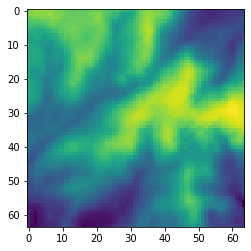

In [719]:
# Generator
code = torch.randn(1, 64)
out = gen(code.cuda())
plt.imshow(out.view(64, 64).cpu().detach().numpy())
plt.show()